# Предсказание стоимости аренды квартир в Чикаго

## Подготовка данных

### Импорт библитек

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns

import phik
from phik import phik_matrix
from phik.report import plot_correlation_matrix
from phik import report

import re
from collections import Counter

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_predict, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor

import folium
from folium.plugins import HeatMap

from scipy.spatial import cKDTree

import pickle

import warnings
warnings.filterwarnings('ignore')

### Загрузка данных

Загрузим датасет с собранными из интернета данными

In [2]:
data = pd.read_csv('/Users/lena/chicago_rent_apartments/chicago_rent.csv')
data.head()

,price,beds,baths,sqft,pets,Kitchen,Features,Unique,Parking,term_length,latitude,longitude,postal_code,link
0,"$1,455+",1–3 Beds,1 Bath,NaN,Cats OK,Dishwasher,NaN,"Dryer, Heating: Gas, On-Site Management, Pet F...",NaN,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley...
1,"$2,600+",1–2 Beds,1–2 Baths,"675-1,295 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a ...",Garage,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-...
2,"$1,395+",Studio,1 Bath,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand ...",NaN,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearbo...
3,"$1,445+",Studio–1 Beds,1 Bath,10 Sqft,Cats OK,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling F...",NaN,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-Nort...
4,"$1,525+",1–3 Beds,1–2 Baths,"659-1,248 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator",Elevator,"Availability 24 Hours, Bicycle storage, Carpet...",NaN,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfa...


In [3]:
# все колонки в нижний регистр
data.columns = data.columns.str.lower()

In [4]:
data.head()

,price,beds,baths,sqft,pets,kitchen,features,unique,parking,term_length,latitude,longitude,postal_code,link
0,"$1,455+",1–3 Beds,1 Bath,NaN,Cats OK,Dishwasher,NaN,"Dryer, Heating: Gas, On-Site Management, Pet F...",NaN,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley...
1,"$2,600+",1–2 Beds,1–2 Baths,"675-1,295 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a ...",Garage,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-...
2,"$1,395+",Studio,1 Bath,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand ...",NaN,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearbo...
3,"$1,445+",Studio–1 Beds,1 Bath,10 Sqft,Cats OK,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling F...",NaN,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-Nort...
4,"$1,525+",1–3 Beds,1–2 Baths,"659-1,248 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator",Elevator,"Availability 24 Hours, Bicycle storage, Carpet...",NaN,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfa...


## Очистка данных

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2071 entries, 0 to 2070
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   price        2043 non-null   object 
 1   beds         2071 non-null   object 
 2   baths        2070 non-null   object 
 3   sqft         1060 non-null   object 
 4   pets         1154 non-null   object 
 5   kitchen      1329 non-null   object 
 6   features     666 non-null    object 
 7   unique       1739 non-null   object 
 8   parking      306 non-null    object 
 9   term_length  490 non-null    object 
 10  latitude     2071 non-null   float64
 11  longitude    2071 non-null   float64
 12  postal_code  2071 non-null   int64  
 13  link         2071 non-null   object 
dtypes: float64(2), int64(1), object(11)
memory usage: 226.6+ KB


Всего в датасете data 14 колонок и 2071 строка.

**Числовые колонки:**

- latitude - широта, координата квартиры
- longitude - долгота, координата квартиры


**Категориальные колонки:**

- price — цена аренды квартиры в Чикаго
- postal_code - почтовый индекс квартиры
- beds — количество спален
- baths — количество ванных комнат
- sqft — площадь квартиры в квадратных футах
- link — ссылка на страницу квартиры на сайте
- pets — политика по домашним животным
- kitchen — кухонные принадлежности
- features — основные удобства квартиры
- unique — уникальные особенности квартиры
- parking — наличие парковочных мест
- term_length — длительность аренды

Необходимо проверить датасет на пропуски, аномалии, преобразовать типы данных.

In [6]:
# Проверим количество пропущенных значений
data.isna().sum()

price            28
beds              0
baths             1
sqft           1011
pets            917
kitchen         742
features       1405
unique          332
parking        1765
term_length    1581
latitude          0
longitude         0
postal_code       0
link              0
dtype: int64

Пропуски в нескольких колонках: price, baths, sqft, pets, kitchen, features, unique, parking, term_length.

Рассмотрим каждую колонку в отдельности. Проверим данные на аномалии, тип данных, пропущенные значения. Решим, какие данные можно преобразовать, какие - удалить.

Проверим строки с пропусками в колонке 'price'

In [7]:
data[data['price'].isna()][['price', 'link']]

,price,link
345,NaN,https://www.apartmentguide.com/rent/130-S-Cana...
409,NaN,https://www.apartmentguide.com/rent/535-N-Mich...
492,NaN,https://www.apartmentguide.com/rent/7622-N-Eas...
637,NaN,https://www.apartmentguide.com/rent/4837-N-Wol...
719,NaN,https://www.apartmentguide.com/rent/5143-S-Ken...
863,NaN,https://www.apartmentguide.com/rent/3819-N-Gre...
1090,NaN,https://www.apartmentguide.com/rent/8921-S-Cot...
1098,NaN,https://www.apartmentguide.com/rent/5136-W-Ros...
1110,NaN,https://www.apartmentguide.com/rent/11-S-Whipp...
1118,NaN,https://www.apartmentguide.com/rent/2844-N-Orc...


Удалим пропущенные значения по колонке 'price', не будем восстанавливать. Это целевая переменная, нам нужны точные данные для дальнейшего обучения модели.

In [8]:
# Удалим пропущенные значения по колонке 'price'
data = data.dropna(subset=['price'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2043 entries, 0 to 2070
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   price        2043 non-null   object 
 1   beds         2043 non-null   object 
 2   baths        2042 non-null   object 
 3   sqft         1046 non-null   object 
 4   pets         1138 non-null   object 
 5   kitchen      1310 non-null   object 
 6   features     657 non-null    object 
 7   unique       1717 non-null   object 
 8   parking      303 non-null    object 
 9   term_length  486 non-null    object 
 10  latitude     2043 non-null   float64
 11  longitude    2043 non-null   float64
 12  postal_code  2043 non-null   int64  
 13  link         2043 non-null   object 
dtypes: float64(2), int64(1), object(11)
memory usage: 239.4+ KB


In [9]:
# Проверим уникальные значения в колонке 'price'
#data['price'].sort_values(ascending=True).unique()
data['price'].head()

0    $1,455+
1    $2,600+
2    $1,395+
3    $1,445+
4    $1,525+
Name: price, dtype: object

В некоторых строках вместо цен указаны значения 'Contact for Price', это тоже пропущенные значения.

In [10]:
# Проверим, как много строк со значнием 'Contact for Price' в колонке 'price'
data[data['price'] == 'Contact for Price'][['price']].count()

price    30
dtype: int64

30 строк со значением 'Contact for Price', удалим эти строки

In [11]:
data = data[data['price'] != 'Contact for Price']

Обработаем значения в колонке 'price', удалим лишние символы и преобразуем в числовой формат

In [12]:
# Убираем символы $, + и запятые
data['price'] = data['price'].str.replace('$', '', regex=False)\
                             .str.replace('+', '', regex=False)\
                             .str.replace(',', '', regex=False)

In [13]:
# Преобразуем в числовой формат
data['price'] = pd.to_numeric(data['price'])

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2013 entries, 0 to 2070
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   price        2013 non-null   int64  
 1   beds         2013 non-null   object 
 2   baths        2012 non-null   object 
 3   sqft         1025 non-null   object 
 4   pets         1122 non-null   object 
 5   kitchen      1299 non-null   object 
 6   features     654 non-null    object 
 7   unique       1689 non-null   object 
 8   parking      296 non-null    object 
 9   term_length  456 non-null    object 
 10  latitude     2013 non-null   float64
 11  longitude    2013 non-null   float64
 12  postal_code  2013 non-null   int64  
 13  link         2013 non-null   object 
dtypes: float64(2), int64(2), object(10)
memory usage: 235.9+ KB


Проверим уникальные значения в колонке 'beds', убедимся, что нет аномальных значений.

In [15]:
data['beds'].sort_values(ascending=True).unique()

array(['1 Bed', '1–2 Beds', '1–3 Beds', '1–4 Beds', '1–6 Beds', '2 Beds',
       '2–3 Beds', '2–4 Beds', '3 Beds', '4 Beds', '5 Beds', '6 Beds',
       'Studio', 'Studio–1 Beds', 'Studio–2 Beds', 'Studio–3 Beds',
       'Studio–4 Beds'], dtype=object)

Пропусков и аномальны значений нет. Обработаем значения: удалим текст, преобразуем данные в числа. 

In [16]:
data['beds'] = ( data['beds'] .str.split('–').str[0] # оставляем только первую часть перед тире 
                .str.replace(r'Beds?', '', regex=True) # удаляем 'Bed'/'Beds' 
                .str.strip() # убираем пробелы 
                .replace({'Studio': 0}) # вместо студии ставим 0 
                .astype(int)) # преобразуем в числа               

In [17]:
data['beds'].sort_values(ascending=True).unique()

array([0, 1, 2, 3, 4, 5, 6])

In [18]:
data.head()

,price,beds,baths,sqft,pets,kitchen,features,unique,parking,term_length,latitude,longitude,postal_code,link
0,1455,1,1 Bath,NaN,Cats OK,Dishwasher,NaN,"Dryer, Heating: Gas, On-Site Management, Pet F...",NaN,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley...
1,2600,1,1–2 Baths,"675-1,295 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a ...",Garage,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-...
2,1395,0,1 Bath,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand ...",NaN,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearbo...
3,1445,0,1 Bath,10 Sqft,Cats OK,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling F...",NaN,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-Nort...
4,1525,1,1–2 Baths,"659-1,248 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator",Elevator,"Availability 24 Hours, Bicycle storage, Carpet...",NaN,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfa...


На основе количества комнат создадим дополнительную колонку 'type' - тип квартиры (апартаменты/студия)

In [19]:
def set_type(beds):
    if beds == 0:
        return 'studio'
    else:
        return 'apartment'

data['type'] = data['beds'].apply(set_type)

In [20]:
data.head()

,price,beds,baths,sqft,pets,kitchen,features,unique,parking,term_length,latitude,longitude,postal_code,link,type
0,1455,1,1 Bath,NaN,Cats OK,Dishwasher,NaN,"Dryer, Heating: Gas, On-Site Management, Pet F...",NaN,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley...,apartment
1,2600,1,1–2 Baths,"675-1,295 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a ...",Garage,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-...,apartment
2,1395,0,1 Bath,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand ...",NaN,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearbo...,studio
3,1445,0,1 Bath,10 Sqft,Cats OK,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling F...",NaN,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-Nort...,studio
4,1525,1,1–2 Baths,"659-1,248 Sqft","Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator",Elevator,"Availability 24 Hours, Bicycle storage, Carpet...",NaN,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfa...,apartment


Проверим значения в колонке 'baths'.

In [21]:
data['baths'].sort_values(ascending=True).unique()

array(['1 Bath', '1.5 Baths', '1.5–2 Baths', '1–1.5 Baths', '1–10 Baths',
       '1–2 Baths', '1–2.5 Baths', '1–3 Baths', '1–4 Baths',
       '1–6.5 Baths', '1–9 Baths', '2 Baths', '2.5 Baths', '2.5–4 Baths',
       '2–3 Baths', '3 Baths', '3.5 Baths', '4 Baths', nan], dtype=object)

Аномалий нет. Дробные значения означают наличие ванных комнат с душем/без душа. Наличие 3-4 ванных комнат выглядят подозрительно. Очистим данные от лишних символов, затем проверим квартиры с большим количеством ванных комнат.

In [22]:
data['baths'] = (
    data['baths']
    .str.split('–').str[0]          # оставляем только первую часть перед тире
    .str.replace(r'Baths?', '', regex=True)  # удаляем 'Bath' или 'Baths'
    .str.strip()                     # убираем пробелы
    .astype(float)                     # преобразуем в числа
)

In [23]:
data['baths'].sort_values(ascending=True).unique()

array([1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , nan])

Проверим какое количество комнат в квартирах с большим количеством ванных комнат

In [24]:
data[data['baths'] > 2.5][['beds', 'baths']]

,beds,baths
223,4,3.0
354,3,3.0
384,4,4.0
420,3,3.0
423,4,3.5
449,3,3.0
486,4,3.0
538,3,3.0
554,3,3.0
794,3,3.0


Аномалий не обнаружено, количество ванных комнат совпадает с количеством спален.

В колонке 'baths' 1 пропущенное значение. Проверим всю строку

In [25]:
data[data['baths'].isna()]

,price,beds,baths,sqft,pets,kitchen,features,unique,parking,term_length,latitude,longitude,postal_code,link,type
280,1050,0,NaN,266-657 Sqft,"Dogs OK, Cats OK",NaN,NaN,"Laundry, Off Street, Pet Friendly, Pets Allowe...",NaN,12-Month,41.80883,-87.60102,60615,https://www.apartmentguide.com/a/4721-S-Ellis-...,studio


Это студия, скорее всего там 1 ванная комната. Заменим пропущенное значение на 1

In [26]:
data['baths'] = data['baths'].fillna(1)

In [27]:
data['baths'].sort_values(ascending=True).unique()

array([1. , 1.5, 2. , 2.5, 3. , 3.5, 4. ])

Проверим значения в колонке с площадью квартир 'sqft'

In [28]:
#data['sqft'].sort_values(ascending=True).unique()
data['sqft'].head()

0               NaN
1    675-1,295 Sqft
2               NaN
3           10 Sqft
4    659-1,248 Sqft
Name: sqft, dtype: object

Обработаем значения, преобразуем в числовой формат.

In [29]:
data['sqft'] = (
    data['sqft']
    .str.split('[-–]').str[0]            # разделяем по обычному '-' или длинному '–'
    .str.replace(',', '', regex=True)    # убираем запятые
    .str.replace(r'Sqft?', '', regex=True)  # убираем текст 'Sqft'
    .str.strip()
    .astype(float)
)

In [30]:
np.set_printoptions(precision=2, suppress=True)

#data['sqft'].sort_values(ascending=True).unique()
data['sqft'].head()

0      NaN
1    675.0
2      NaN
3     10.0
4    659.0
Name: sqft, dtype: float64

Квартиры с площадью 1-10 sqft выглядят необычно (0.09 - 0,93 кв.м.). Проверим эти апартаменты отдельно.

In [31]:
pd.set_option("display.max_colwidth", None)
data[data['sqft'] < 200][['sqft', 'beds', 'link']].sort_values(by='sqft', ascending=True)

,sqft,beds,link
894,1.0,3,https://www.apartmentguide.com/rent/5015-N-Lincoln-Ave-Chicago-IL-LV2240565759/
848,1.0,2,https://www.apartmentguide.com/rent/1963-W-Foster-Ave-Chicago-IL-LV670249194/
1927,1.0,0,https://www.apartmentguide.com/rent/2910-N-Mildred-Ave-Chicago-IL-LV771632111/
1438,1.0,0,https://www.apartmentguide.com/rent/4604-N-Beacon-St-Chicago-IL-LV2370778516/
2021,1.0,1,https://www.apartmentguide.com/rent/624-W-Barry-Ave-Chicago-IL-LV2404905839/
1980,1.0,1,https://www.apartmentguide.com/rent/817-W-Cornelia-Ave-Chicago-IL-LV2404909304/
1946,1.0,1,https://www.apartmentguide.com/rent/556-W-Wellington-Ave-Chicago-IL-LV2304482933/
1944,1.0,1,https://www.apartmentguide.com/rent/825-W-Waveland-Ave-Chicago-IL-LV2404905863/
1369,5.0,2,https://www.apartmentguide.com/rent/5443-S-Federal-St-3-Chicago-IL-6242904/
3,10.0,0,https://www.apartmentguide.com/a/Dearborn-North-Chicago-IL-5930504/


Похоже, что значения 1-10 использовались в качестве заглушки, заменим пока что эти значения на NaN, на этапе разработки pipeline заменим эти пропуски импутером.

In [32]:
data.loc[data['sqft'] < 181, 'sqft'] = np.nan

In [33]:
data.head()

,price,beds,baths,sqft,pets,kitchen,features,unique,parking,term_length,latitude,longitude,postal_code,link,type
0,1455,1,1.0,NaN,Cats OK,Dishwasher,NaN,"Dryer, Heating: Gas, On-Site Management, Pet Friendly, Washer",NaN,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley-Chicago-IL-6003150/,apartment
1,2600,1,1.0,675.0,"Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a Healthy City, AcceptsCreditCardPayments, AcceptsElectronicPayments, Additional Storage, Availability 24 Hours, Bicycle storage, Cable, Courtyard, Disposal, Dryer, Exterior Type: Conventional, Free Weights, FreewayAccess, Gated Entry, Granite Countertops, HardwoodFloor, High-speed Internet Ready, Individual Climate Control, Kevo & Nest Smart Homes, Large Closets, On-Site Maintenance, On-Site Management, Package Receiving, Pet Friendly, PetCare, PetScreening, PetsAllowed, Pool, Private Balcony, Private Patio, Range, Sundeck, TileFloors, Transportation, Unique Design Style, Washer, Wheel Chair, Window Coverings",Garage,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-Loop-Chicago-IL-5895181/,apartment
2,1395,0,1.0,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand New Units, Ceiling Fan, Freezer, Heat, High-speed Internet Ready, Intercom system, Laundry, New Appliances, Online Maintenance Portal, Online Rent Payment, Oven, Pet Friendly, Range, Rooftop Deck, Spacious Closets, View Type: City",NaN,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearborn-Chicago-IL-5909882/,studio
3,1445,0,1.0,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling Fan, Gazebo, Heating: Gas, Heating: Heat pump, High-speed Internet Ready, Laundry, Library, New bathroom new floor, Package Receiving, Pet Friendly, Range, Tile Flooring, Trash Compactor",NaN,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-North-Chicago-IL-5930504/,studio
4,1525,1,1.0,659.0,"Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator",Elevator,"Availability 24 Hours, Bicycle storage, Carpeting (select apartments), Ceiling Fan, Disposal, Furnished, Historic Building, Large Closets, Laundry, On-Site Maintenance, Pet Friendly, Range, Recycling, Resident Keychain Program, TV Lounge, Transportation, Window Coverings",NaN,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfax-Chicago-IL-5918352/,apartment


Рассмотрим колонку с информацией о политике по домашним животным 'pets'.

In [34]:
data['pets'].sort_values(ascending=True).unique()

array(['Cats OK', 'Dogs OK', 'Dogs OK, Cats OK', nan], dtype=object)

В колонке есть пропущенные значения. Будем считать, что, если в колонке отсутствует данная информация, значит домашние животные не разрешены в квартире.
  
Напишем функцию, которая будет ставит в строке 0, если есть пропущенное значение и 1, если есть упоминание про домашних животных.

In [35]:
def pets_flag(x):
    return 0 if pd.isna(x) else 1

data['pets_friendly'] = data['pets'].apply(pets_flag)

In [36]:
data.head()

,price,beds,baths,sqft,pets,kitchen,features,unique,parking,term_length,latitude,longitude,postal_code,link,type,pets_friendly
0,1455,1,1.0,NaN,Cats OK,Dishwasher,NaN,"Dryer, Heating: Gas, On-Site Management, Pet Friendly, Washer",NaN,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley-Chicago-IL-6003150/,apartment,1
1,2600,1,1.0,675.0,"Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a Healthy City, AcceptsCreditCardPayments, AcceptsElectronicPayments, Additional Storage, Availability 24 Hours, Bicycle storage, Cable, Courtyard, Disposal, Dryer, Exterior Type: Conventional, Free Weights, FreewayAccess, Gated Entry, Granite Countertops, HardwoodFloor, High-speed Internet Ready, Individual Climate Control, Kevo & Nest Smart Homes, Large Closets, On-Site Maintenance, On-Site Management, Package Receiving, Pet Friendly, PetCare, PetScreening, PetsAllowed, Pool, Private Balcony, Private Patio, Range, Sundeck, TileFloors, Transportation, Unique Design Style, Washer, Wheel Chair, Window Coverings",Garage,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-Loop-Chicago-IL-5895181/,apartment,1
2,1395,0,1.0,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand New Units, Ceiling Fan, Freezer, Heat, High-speed Internet Ready, Intercom system, Laundry, New Appliances, Online Maintenance Portal, Online Rent Payment, Oven, Pet Friendly, Range, Rooftop Deck, Spacious Closets, View Type: City",NaN,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearborn-Chicago-IL-5909882/,studio,1
3,1445,0,1.0,NaN,Cats OK,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling Fan, Gazebo, Heating: Gas, Heating: Heat pump, High-speed Internet Ready, Laundry, Library, New bathroom new floor, Package Receiving, Pet Friendly, Range, Tile Flooring, Trash Compactor",NaN,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-North-Chicago-IL-5930504/,studio,1
4,1525,1,1.0,659.0,"Dogs OK, Cats OK","Dishwasher, Microwave, Refrigerator",Elevator,"Availability 24 Hours, Bicycle storage, Carpeting (select apartments), Ceiling Fan, Disposal, Furnished, Historic Building, Large Closets, Laundry, On-Site Maintenance, Pet Friendly, Range, Recycling, Resident Keychain Program, TV Lounge, Transportation, Window Coverings",NaN,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfax-Chicago-IL-5918352/,apartment,1


In [37]:
# Удаляем старую колонку pets
data = data.drop(columns=['pets'])

In [38]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2013 entries, 0 to 2070
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          2013 non-null   int64  
 1   beds           2013 non-null   int64  
 2   baths          2013 non-null   float64
 3   sqft           1014 non-null   float64
 4   kitchen        1299 non-null   object 
 5   features       654 non-null    object 
 6   unique         1689 non-null   object 
 7   parking        296 non-null    object 
 8   term_length    456 non-null    object 
 9   latitude       2013 non-null   float64
 10  longitude      2013 non-null   float64
 11  postal_code    2013 non-null   int64  
 12  link           2013 non-null   object 
 13  type           2013 non-null   object 
 14  pets_friendly  2013 non-null   int64  
dtypes: float64(4), int64(4), object(7)
memory usage: 251.6+ KB


Проверим колонку с кухонными принадлежностями

In [39]:
data['kitchen'].head()

0                             Dishwasher
1    Dishwasher, Microwave, Refrigerator
2    Dishwasher, Microwave, Refrigerator
3    Dishwasher, Microwave, Refrigerator
4    Dishwasher, Microwave, Refrigerator
Name: kitchen, dtype: object

Напишем функцию, которая преобразует текстовую информацию о кухне в набор бинарных признаков (0/1) для каждой техники.

In [40]:
appliances = ['Dishwasher', 'Microwave', 'Refrigerator', 'Stainless Steel Appliances']  # остальные колонки
columns_snake = [a.lower().replace(' ', '_') for a in appliances]

def split_appliances(kitchen_text):
    values = []
    for app in appliances:
        if isinstance(kitchen_text, str) and app in kitchen_text:
            values.append(1)
        else:
            values.append(0)
    # отдельная колонка для Stove / Gas Stove
    if isinstance(kitchen_text, str) and ('Stove' in kitchen_text or 'Gas Stove' in kitchen_text):
        values.append(1)
    else:
        values.append(0)
    return pd.Series(values)

# добавляем имена колонок
data[columns_snake + ['stove']] = data['kitchen'].apply(split_appliances)

In [41]:
data.head()

,price,beds,baths,sqft,kitchen,features,unique,parking,term_length,latitude,longitude,postal_code,link,type,pets_friendly,dishwasher,microwave,refrigerator,stainless_steel_appliances,stove
0,1455,1,1.0,NaN,Dishwasher,NaN,"Dryer, Heating: Gas, On-Site Management, Pet Friendly, Washer",NaN,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley-Chicago-IL-6003150/,apartment,1,1,0,0,0,0
1,2600,1,1.0,675.0,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a Healthy City, AcceptsCreditCardPayments, AcceptsElectronicPayments, Additional Storage, Availability 24 Hours, Bicycle storage, Cable, Courtyard, Disposal, Dryer, Exterior Type: Conventional, Free Weights, FreewayAccess, Gated Entry, Granite Countertops, HardwoodFloor, High-speed Internet Ready, Individual Climate Control, Kevo & Nest Smart Homes, Large Closets, On-Site Maintenance, On-Site Management, Package Receiving, Pet Friendly, PetCare, PetScreening, PetsAllowed, Pool, Private Balcony, Private Patio, Range, Sundeck, TileFloors, Transportation, Unique Design Style, Washer, Wheel Chair, Window Coverings",Garage,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-Loop-Chicago-IL-5895181/,apartment,1,1,1,1,0,0
2,1395,0,1.0,NaN,"Dishwasher, Microwave, Refrigerator","Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand New Units, Ceiling Fan, Freezer, Heat, High-speed Internet Ready, Intercom system, Laundry, New Appliances, Online Maintenance Portal, Online Rent Payment, Oven, Pet Friendly, Range, Rooftop Deck, Spacious Closets, View Type: City",NaN,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearborn-Chicago-IL-5909882/,studio,1,1,1,1,0,0
3,1445,0,1.0,NaN,"Dishwasher, Microwave, Refrigerator","Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling Fan, Gazebo, Heating: Gas, Heating: Heat pump, High-speed Internet Ready, Laundry, Library, New bathroom new floor, Package Receiving, Pet Friendly, Range, Tile Flooring, Trash Compactor",NaN,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-North-Chicago-IL-5930504/,studio,1,1,1,1,0,0
4,1525,1,1.0,659.0,"Dishwasher, Microwave, Refrigerator",Elevator,"Availability 24 Hours, Bicycle storage, Carpeting (select apartments), Ceiling Fan, Disposal, Furnished, Historic Building, Large Closets, Laundry, On-Site Maintenance, Pet Friendly, Range, Recycling, Resident Keychain Program, TV Lounge, Transportation, Window Coverings",NaN,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfax-Chicago-IL-5918352/,apartment,1,1,1,1,0,0


In [42]:
# Удаляем старую колонку
data = data.drop(columns=['kitchen'])

In [43]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2013 entries, 0 to 2070
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   price                       2013 non-null   int64  
 1   beds                        2013 non-null   int64  
 2   baths                       2013 non-null   float64
 3   sqft                        1014 non-null   float64
 4   features                    654 non-null    object 
 5   unique                      1689 non-null   object 
 6   parking                     296 non-null    object 
 7   term_length                 456 non-null    object 
 8   latitude                    2013 non-null   float64
 9   longitude                   2013 non-null   float64
 10  postal_code                 2013 non-null   int64  
 11  link                        2013 non-null   object 
 12  type                        2013 non-null   object 
 13  pets_friendly               2013 non-n

Рассмотрим значения в колонке с особенностями 'features'

In [44]:
data['features'].head()

0                                             NaN
1    Office Center/Conference Room, Elevator, Gym
2                                   Elevator, Gym
3              Office Center/Conference Room, Gym
4                                        Elevator
Name: features, dtype: object

Напишем функцию, которая преобразует текстовую информацию в набор бинарных признаков (0/1) для каждой фичи.

In [45]:
features_list = [
    'Gym',
    'Elevator',
    'Office Center/Conference Room',
    'On-Site Laundry',
    'Hot Tub',
    'Rec Room',
    'Smoke-Free',
    'Pool',
    'Playground'
]

# создаём имена колонок в snake_case
features_snake = [
    f.lower()
     .replace(' ', '_')
     .replace('/', '_')
     .replace('-', '_')
    for f in features_list
]

def split_features(features_text):
    values = []
    for f in features_list:
        if isinstance(features_text, str):
            # объединяем Office Center/Conference Room и Conference Room
            if f == 'Office Center/Conference Room':
                check = 'Office Center/Conference Room' in features_text or 'Conference Room' in features_text
            else:
                check = f in features_text
            values.append(1 if check else 0)
        else:
            values.append(0)
    return pd.Series(values)

data[features_snake] = data['features'].apply(split_features)

In [46]:
data.head()

,price,beds,baths,sqft,features,unique,parking,term_length,latitude,longitude,...,stove,gym,elevator,office_center_conference_room,on_site_laundry,hot_tub,rec_room,smoke_free,pool,playground
0,1455,1,1.0,NaN,NaN,"Dryer, Heating: Gas, On-Site Management, Pet Friendly, Washer",NaN,12-Month,42.017309,-87.68180,...,0,0,0,0,0,0,0,0,0,0
1,2600,1,1.0,675.0,"Office Center/Conference Room, Elevator, Gym","2 Blocks from Metra Train, A Green Roof for a Healthy City, AcceptsCreditCardPayments, AcceptsElectronicPayments, Additional Storage, Availability 24 Hours, Bicycle storage, Cable, Courtyard, Disposal, Dryer, Exterior Type: Conventional, Free Weights, FreewayAccess, Gated Entry, Granite Countertops, HardwoodFloor, High-speed Internet Ready, Individual Climate Control, Kevo & Nest Smart Homes, Large Closets, On-Site Maintenance, On-Site Management, Package Receiving, Pet Friendly, PetCare, PetScreening, PetsAllowed, Pool, Private Balcony, Private Patio, Range, Sundeck, TileFloors, Transportation, Unique Design Style, Washer, Wheel Chair, Window Coverings",Garage,12-Month,41.855907,-87.62507,...,0,1,1,1,0,0,0,0,0,0
2,1395,0,1.0,NaN,"Elevator, Gym","Availability 24 Hours, Bicycle storage, Brand New Units, Ceiling Fan, Freezer, Heat, High-speed Internet Ready, Intercom system, Laundry, New Appliances, Online Maintenance Portal, Online Rent Payment, Oven, Pet Friendly, Range, Rooftop Deck, Spacious Closets, View Type: City",NaN,12-Month,41.901694,-87.63034,...,0,1,1,0,0,0,0,0,0,0
3,1445,0,1.0,NaN,"Office Center/Conference Room, Gym","Additional Storage, Bicycle storage, Ceiling Fan, Gazebo, Heating: Gas, Heating: Heat pump, High-speed Internet Ready, Laundry, Library, New bathroom new floor, Package Receiving, Pet Friendly, Range, Tile Flooring, Trash Compactor",NaN,12-Month,41.902461,-87.62952,...,0,1,0,1,0,0,0,0,0,0
4,1525,1,1.0,659.0,Elevator,"Availability 24 Hours, Bicycle storage, Carpeting (select apartments), Ceiling Fan, Disposal, Furnished, Historic Building, Large Closets, Laundry, On-Site Maintenance, Pet Friendly, Range, Recycling, Resident Keychain Program, TV Lounge, Transportation, Window Coverings",NaN,12-Month,41.802219,-87.59230,...,0,0,1,0,0,0,0,0,0,0


In [47]:
# Удаляем старую колонку
data = data.drop(columns=['features'])

Проверим значения в колонке 'parking'

In [48]:
data['parking'].sort_values(ascending=True).unique()

array(['Garage', 'Garage, Parking Available', 'Parking Available', nan],
      dtype=object)

Есть пропущенные значения. Будем считать, что пропущенные значения означают отсутствие парковочных мест.
Напишем функцию, которая заменит все пропуски 0, а текст - 1.

In [49]:
def convert_parking(x):
    return 0 if pd.isna(x) else 1

data['parking'] = data['parking'].apply(convert_parking)

In [50]:
data['parking'].unique()

array([0, 1])

Рассмотрим значения в колонке с дополнительными удобствами 

In [51]:
data['unique'].head()

0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            Dryer, Heating: Gas, On-Site Management, Pet Friendly, Washer
1    2 Blocks from Metra Train, A Green Roof for a Healthy City, AcceptsCreditCardPayments, AcceptsElectronicPayments, Additional Storage, Availability 24 Hours, Bicycle storage, Cable, Courtyard, Disposal, Dryer, Exterior Type: Conventional, Free Weights, FreewayAccess, Gated Entry, Granite Countertops, HardwoodFloor, High-speed I

В колонке 'unique' в каждой строке перечислены через запятую разные удобства, нужно понять, какие из этих удобств встречаются чаще всего по всему датасету, чтобы создать на их основе. например, новые бинарные колонки.

In [52]:
# Разбиваем все строки по запятой и объединяем в один список
all_features = data['unique'].dropna().str.split(',').sum()

# Убираем лишние пробелы
all_features = [f.strip() for f in all_features]

# Считаем частоту каждого элемента
feature_counts = Counter(all_features)

# Сортируем по убыванию популярности
most_common_features = feature_counts.most_common(20)  # топ-20
most_common_features


[('Pet Friendly', 1112),
 ('Heat', 569),
 ('Outdoor Parking', 557),
 ('Pool', 232),
 ('Laundry', 181),
 ('Granite Countertops', 176),
 ('Ceiling Fans', 138),
 ('Bicycle storage', 124),
 ('Quartz Countertops', 111),
 ('Smoke-Free', 94),
 ('Range', 90),
 ('Washer', 89),
 ('Dryer', 87),
 ('Intercom system', 87),
 ('Private Yard', 86),
 ('No_WasherDryer', 84),
 ('Package Receiving', 76),
 ('Oven', 74),
 ('Availability 24 Hours', 68),
 ('High-speed Internet Ready', 65)]

Выберем самые популярные фичи. Напишем функцию, которая будет кодировать уникальные/особенные удобства квартиры в бинарные признаки (0/1).

In [53]:
# список признаков
unique_map = {
    'heat': ['Heat'],
    'granite_countertops': ['Granite Countertops'],
    'ceiling_fans': ['Ceiling Fans'],
    'bicycle_storage': ['Bicycle storage'],
    'quartz_countertops': ['Quartz Countertops']
}

def split_unique(unique_text):
    values = []
    for col, variants in unique_map.items():
        if isinstance(unique_text, str) and any(v in unique_text for v in variants):
            values.append(1)
        else:
            values.append(0)
    return pd.Series(values)

# добавляем новые колонки
data[list(unique_map.keys())] = data['unique'].apply(split_unique)

Дополним и скорректируем признаки pets_friendly, parking, pool, on_site_laundry в датафрейме.
Если в описании unique есть слова, связанные с этими признаками - ставим 1, в остальных случаях - 0.

In [54]:
def update_pets_friendly(row):
    # если уже 1 — оставляем
    if row['pets_friendly'] == 1:
        return 1
    if isinstance(row['unique'], str) and 'pet friendly' in row['unique'].lower():
        return 1
    return 0

data['pets_friendly'] = data.apply(update_pets_friendly, axis=1)

In [55]:
def update_parking(row):
    if row['parking'] == 1:
        return 1
    if isinstance(row['unique'], str) and 'outdoor parking' in row['unique'].lower():
        return 1
    return 0

data['parking'] = data.apply(update_parking, axis=1)

In [56]:
def update_pool(row):
    if row['pool'] == 1:  
        return 1
    if isinstance(row['unique'], str) and 'pool' in row['unique'].lower():
        return 1
    return 0

data['pool'] = data.apply(update_pool, axis=1)

In [57]:
def update_laundry(row):
    if row['on_site_laundry'] == 1:  
        return 1
    if isinstance(row['unique'], str) and 'laundry' in row['unique'].lower():
        return 1
    return 0

data['on_site_laundry'] = data.apply(update_laundry, axis=1)

In [58]:
# Удаляем колонку
data = data.drop(columns=['unique'])

In [59]:
data.head()

,price,beds,baths,sqft,parking,term_length,latitude,longitude,postal_code,link,...,hot_tub,rec_room,smoke_free,pool,playground,heat,granite_countertops,ceiling_fans,bicycle_storage,quartz_countertops
0,1455,1,1.0,NaN,0,12-Month,42.017309,-87.68180,60645,https://www.apartmentguide.com/a/7444-N-Seeley-Chicago-IL-6003150/,...,0,0,0,0,0,1,0,0,0,0
1,2600,1,1.0,675.0,1,12-Month,41.855907,-87.62507,60616,https://www.apartmentguide.com/a/Arrive-South-Loop-Chicago-IL-5895181/,...,0,0,0,1,0,0,1,0,1,0
2,1395,0,1.0,NaN,0,12-Month,41.901694,-87.63034,60610,https://www.apartmentguide.com/a/1036-N-Dearborn-Chicago-IL-5909882/,...,0,0,0,0,0,1,0,0,1,0
3,1445,0,1.0,NaN,0,12-Month,41.902461,-87.62952,60610,https://www.apartmentguide.com/a/Dearborn-North-Chicago-IL-5930504/,...,0,0,0,0,0,1,0,0,1,0
4,1525,1,1.0,659.0,0,12-Month,41.802219,-87.59230,60615,https://www.apartmentguide.com/a/Ivy-At-Fairfax-Chicago-IL-5918352/,...,0,0,0,0,0,0,0,0,1,0


Проверим значения в колонке со сроком аренды 'term_length'

In [60]:
data['term_length'].sort_values(ascending=True).unique()

array(['12-Month', nan], dtype=object)

В колонке 'term_length' либо '12-Month', либо пропуск. Удалим столбец 'term_length', скорее всего все апартаменты на длительный срок.
Удалим так же колонку с ссылками на карточки 'link', этот признак нам больше не пригодиться.

In [61]:
# Удаляем колонки
data = data.drop(columns=['term_length', 'link'])

Проверим данные на наличие явных дублей

In [62]:
data.duplicated().sum()

np.int64(21)

In [63]:
# Удалим явные дубли
data = data.drop_duplicates()

In [64]:
data.duplicated().sum()

np.int64(0)

In [65]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1992 entries, 0 to 2070
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   price                          1992 non-null   int64  
 1   beds                           1992 non-null   int64  
 2   baths                          1992 non-null   float64
 3   sqft                           993 non-null    float64
 4   parking                        1992 non-null   int64  
 5   latitude                       1992 non-null   float64
 6   longitude                      1992 non-null   float64
 7   postal_code                    1992 non-null   int64  
 8   type                           1992 non-null   object 
 9   pets_friendly                  1992 non-null   int64  
 10  dishwasher                     1992 non-null   int64  
 11  microwave                      1992 non-null   int64  
 12  refrigerator                   1992 non-null   int64 

### Вывод

Провели обработку данных:


- Заполнили или удалили пропущенные значения в колонках (кроме 'sqft' - заполним на этапе pipeline)
- Преобразовали столбцы с текстовыми значениями
- Преобразовали типы данных

Стало 29 колонок с признаками и 1992 строки.

**Числовые значения:**

- price - цена аренды квартиры в Чикаго
- beds - количество спален                            
- baths - количество ванных комнат                      
- sqft - площадь квартиры в квадратных футах                                   
- latitude - широта, координата квартиры               
- longitude - долгота, координата квартиры         


**Категориальные значения:**


- type - тип квартиры (апартаменты / студия)
- postal_code - почтовый индекс квартиры  

по типу данных - числовые, но это бинарные признаки, по смыслу - категории:

- parking - наличие парковочных мест (0 - нет /1 - да) 
- pets_friendly - политика по домашним животным (0 - не разрешены/1 - разрешены)                  
- dishwasher - наличие посудомоечной машины (0 - нет /1 - да)                     
- microwave - наличие микроволновой печи (0 - нет /1 - да)                       
- refrigerator - наличие холодильника (0 - нет /1 - да)                     
- stainless_steel_appliances - техника из нержавеющей стали (0 - нет /1 - да)       
- stove - наличие духовки (0 - нет /1 - да)                           
- gym - наличие спортзала (0 - нет /1 - да)                            
- elevator - наличие лифта (0 - нет /1 - да)                        
- office_center_conference_room - наличие офисного центра, конференц-зала (0 - нет /1 - да)
- on_site_laundry - наличие прачечной (0 - нет /1 - да)                  
- hot_tub - наличие джакузи / гидромассажной ванны (0 - нет /1 - да)                           
- rec_room - наличие комнаты отдыха (0 - нет /1 - да)                       
- smoke_free - разрешено ли курить (0 - да /1 - нет)                      
- pool - наличие бассейна (0 - нет /1 - да)                             
- playground - наличие игровой площадки (0 - нет /1 - да)                      
- heat - наличие отопления (0 - нет /1 - да)                           
- granite_countertops - наличие гранитной столешницы на кухне (0 - нет /1 - да)            
- ceiling_fans - наличие потолочного вентилятора (0 - нет /1 - да)
- quartz_countertops - наличие столешницы из кварца (0 - нет /1 - да) 
- bicycle_storage - наличие помещения для хранения велосипедов (0 - нет /1 - да)                 

## Исследовательский анализ данных

### Анализ числовых признаков

Проведем исследовательский анализ числовых признаков:

In [66]:
# Получим дополнительно информацию с помощью describe()
data[['price', 'beds', 'baths', 'sqft']].describe().T

,count,mean,std,min,25%,50%,75%,max
price,1992.0,2309.246988,2845.682074,659.0,1509.75,1950.0,2595.0,60657.0
beds,1992.0,1.455823,0.989171,0.0,1.00,1.0,2.0,6.0
baths,1992.0,1.192771,0.424912,1.0,1.00,1.0,1.0,4.0
sqft,993.0,862.216516,439.779832,181.0,569.00,787.0,1073.0,4500.0


Цены на аренду квартир (апартаменты или студии) в Чикаго:

- От *\$659* до *\$60657*. В среднем — 2309 *\$*.
(Позже рассмотрим эти значения отдельно.)

Количество спален:

- От 0 до 6 (0 — студии, так как гостиная не считается отдельной комнатой).

Количество ванных комнат:

- От 1 до 4.

Размер квартир:

- От 181 до 4500 sqft. В среднем — 862.2 sqft.



Построим гистограммы для числовых признаков: 'price', 'sqft', чтобы изучить распределение данных

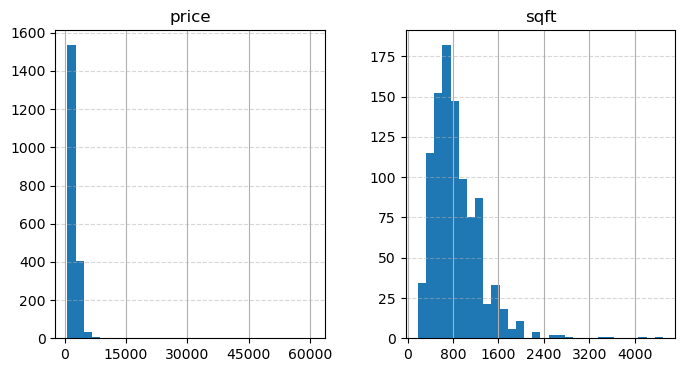

In [67]:
hist_col = ['price', 'sqft']

ax = data[hist_col].hist(figsize=(8, 4), bins=30)  

# Для каждого графика задаём деления по оси X
for a in ax.flatten():
    a.xaxis.set_major_locator(plt.MaxNLocator(6)) 
    a.grid(True, axis='y', linestyle='--', alpha=0.5)

plt.show()

Построим дополнительно график "ящик с усами"

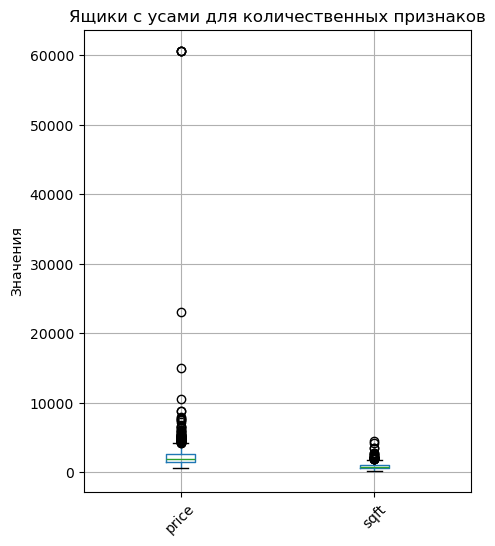

In [68]:
# Список признаков
features = ['price', 'sqft']

plt.figure(figsize=(5, 6))
data[features].boxplot()
plt.title("Ящики с усами для количественных признаков")
plt.ylabel("Значения")
plt.xticks(rotation=45)
plt.show()

- Большинство значений 'price' расположены в диапазоне от 1000 до 3000 *\$*. Есть выбросы (цены более 56000 *\$*).

- Большинство значений 'sqft' расположены в диапазоне от 500 до 1000 sqft. Есть выбросы (площади квартир более 2000 sqft).

### Анализ категориальных значений

Построим столбчатые диаграммы для категориальных и некоторых числовых признаков

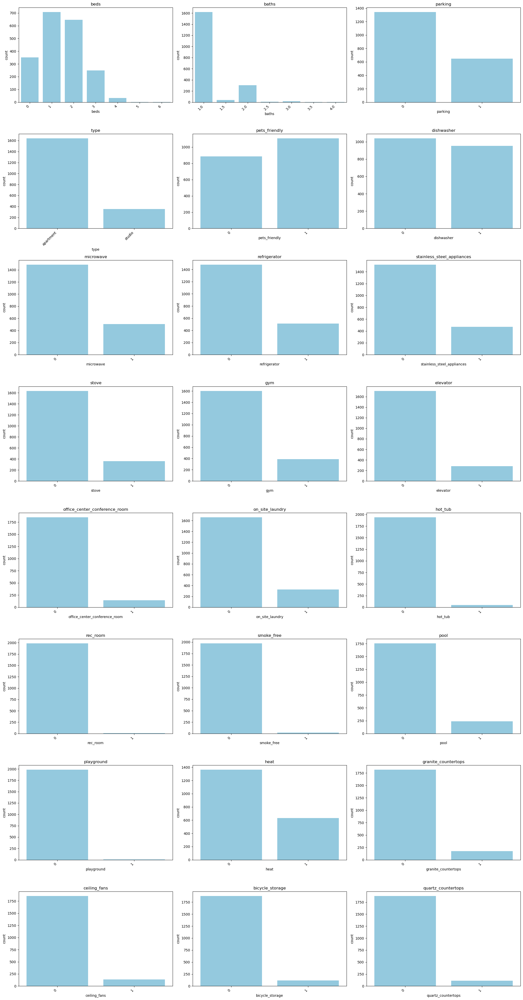

In [69]:
bar_cols = [
    'beds', 'baths', 'parking',
    'type', 'pets_friendly', 'dishwasher', 'microwave',
    'refrigerator', 'stainless_steel_appliances', 'stove', 'gym',
    'elevator', 'office_center_conference_room', 'on_site_laundry',
    'hot_tub', 'rec_room', 'smoke_free', 'pool', 'playground', 'heat',
    'granite_countertops', 'ceiling_fans', 'bicycle_storage',
    'quartz_countertops'
]

n_cols = 3
n_rows = (len(bar_cols) + n_cols - 1) // n_cols

plt.figure(figsize=(n_cols*7, n_rows*5))

for i, col in enumerate(bar_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    if data[col].dtype == 'O':  
        sns.countplot(
            x=col,
            data=data,
            order=data[col].value_counts().index,
            color='skyblue'  
        )
    else:
        sns.countplot(
            x=col,
            data=data,
            color='skyblue'
        )
    plt.title(col, fontsize=12)
    plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

**Большинство квартир в Чикаго:**

- апартаменты с 1–2 спальнями и 1 ванной

- без парковки, лифта, спортзала, бассейна и джакузи

- разрешено проживание с животными

- без отопления и потолочных вентиляторов

- без кухонной техники (микроволновка, духовка, холодильник, посудомойка, нержавеющие приборы)

- без столешниц из гранита или кварца

- без прачечной, комнаты отдыха, детской площадки, хранения велосипедов

- нет запрета на курение

Возможно, некоторые владельцы или агенты не указали все удобства в объявлениях, хотя они есть (например, отопление).

Рассмотрим значения целевого признака 'price' внимательнее.

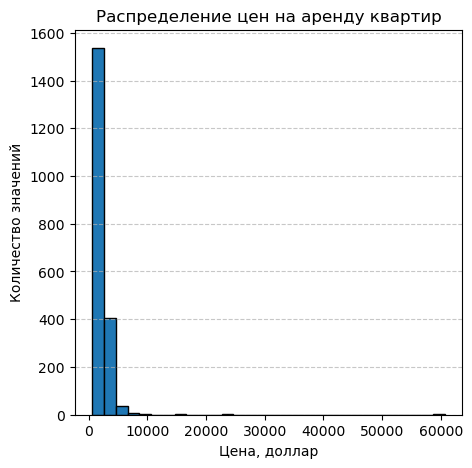

In [70]:
data['price'].plot(kind='hist', bins=30, edgecolor='black', figsize=(5, 5))
plt.title('Распределение цен на аренду квартир')
plt.xlabel('Цена, доллар')
plt.ylabel('Количество значений')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Квартиры с арендой выше 50,000 *\$* в месяц выглядят нереалистично. По данным нескольких сайтов аренды в Чикаго, самые высокие цены не превышали 30,000 *\$* в месяц.

In [71]:
data[data['price'] > 15000][['price']].count()

price    5
dtype: int64

In [72]:
data[data['price'] > 15000].head()

,price,beds,baths,sqft,parking,latitude,longitude,postal_code,type,pets_friendly,...,hot_tub,rec_room,smoke_free,pool,playground,heat,granite_countertops,ceiling_fans,bicycle_storage,quartz_countertops
486,22995,4,3.0,3418.0,0,41.885073,-87.650483,60607,apartment,1,...,0,0,0,1,0,0,0,0,0,1
1144,60623,1,1.0,NaN,0,41.838566,-87.728259,60623,apartment,1,...,0,0,0,0,0,0,0,0,0,0
1277,60657,2,2.0,NaN,0,41.938364,-87.644644,60657,apartment,0,...,0,0,0,0,0,0,0,0,0,0
1300,60613,2,1.0,NaN,0,41.953077,-87.665341,60613,apartment,0,...,0,0,0,0,0,0,1,0,0,0
1440,60657,2,1.0,NaN,0,41.945172,-87.650984,60657,apartment,0,...,0,0,0,0,0,0,0,0,0,0


Удалим значения с ценами более 30,000 *\$*

In [73]:
data = data[data['price'] < 30000]

In [74]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1988 entries, 0 to 2070
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   price                          1988 non-null   int64  
 1   beds                           1988 non-null   int64  
 2   baths                          1988 non-null   float64
 3   sqft                           993 non-null    float64
 4   parking                        1988 non-null   int64  
 5   latitude                       1988 non-null   float64
 6   longitude                      1988 non-null   float64
 7   postal_code                    1988 non-null   int64  
 8   type                           1988 non-null   object 
 9   pets_friendly                  1988 non-null   int64  
 10  dishwasher                     1988 non-null   int64  
 11  microwave                      1988 non-null   int64  
 12  refrigerator                   1988 non-null   int64 

### Соотношение признаков с целевой переменной price

Построим график scatterplot для признаков 'price' и 'sqft'

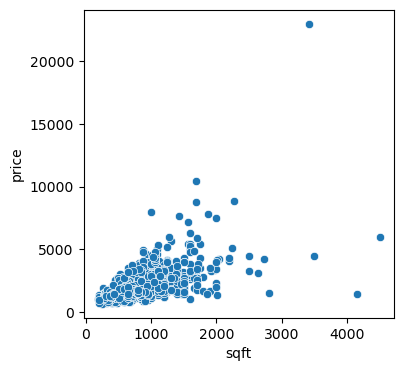

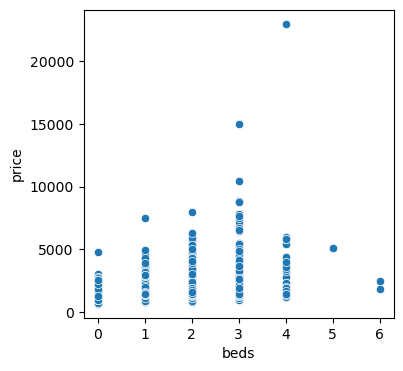

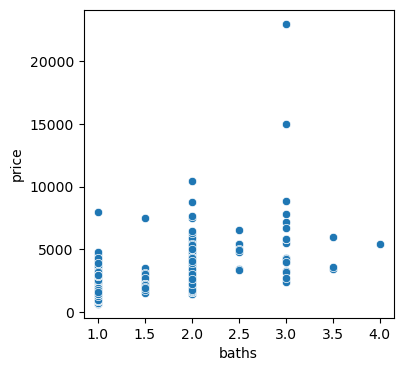

In [75]:
# площадь квартиры и цена
plt.figure(figsize=(4, 4))
sns.scatterplot(x='sqft', y='price', data=data)
plt.show()

# количество спален и цена
plt.figure(figsize=(4, 4))
sns.scatterplot(x='beds', y='price', data=data)
plt.show()

# количество ванных и цена
plt.figure(figsize=(4, 4))
sns.scatterplot(x='baths', y='price', data=data)
plt.show()

Диаграмма рассеяния показывает, что существует связь между ценой аренды и площадью квартиры: чем больше площадь, тем выше стоимость аренды.

Также видно, что цены растут для квартир с 0–3 спальнями, но для 4–6 спален цены не существенно выше. Аналогичная ситуация наблюдается для числа ванных комнат.

Возможно, это связано с тем, что в датасете мало данных для больших квартир, и редкие дорогие квартиры почти не влияют на визуализацию.

Кроме того, возможно, цена зависит не только от количества спален и ванных, но и от района, состояния квартиры, наличия парковки и других удобств. Например, 4-спальная квартира в менее престижном районе может стоить так же, как 2-спальная в хорошем районе.

Дополнительно построим графики violinplot для бинарных признаков.

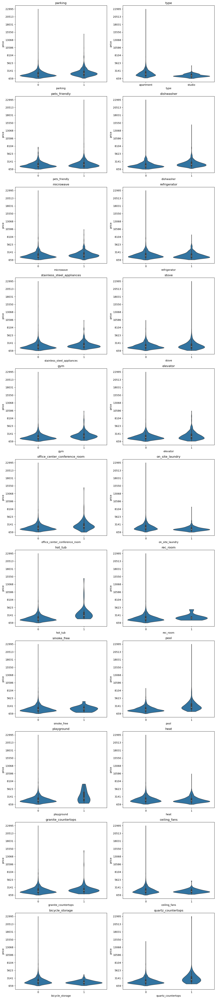

In [76]:
# список признаков
cat_features = [
    'parking',
    'type', 'pets_friendly', 'dishwasher', 'microwave',
    'refrigerator', 'stainless_steel_appliances', 'stove', 'gym',
    'elevator', 'office_center_conference_room', 'on_site_laundry',
    'hot_tub', 'rec_room', 'smoke_free', 'pool', 'playground', 'heat',
    'granite_countertops', 'ceiling_fans', 'bicycle_storage',
    'quartz_countertops'
]

# сетка для подграфиков
n_cols = 2
n_rows = (len(cat_features) + n_cols - 1) // n_cols

plt.figure(figsize=(n_cols*6, n_rows*5))

for i, col in enumerate(cat_features, 1):
    plt.subplot(n_rows, n_cols, i)
    try:
        sns.violinplot(x=col, y='price', data=data, cut=0)
        plt.title(col)
        plt.yticks(np.linspace(data['price'].min(), data['price'].max(), 10))
    except Exception as e:
        plt.text(0.5, 0.5, f'Ошибка: {e}', ha='center')

plt.tight_layout()
plt.show()


Графики показывают, что некоторые бинарные признаки связаны с целевой переменной — ценой аренды:

- Выше медианные цены у апартаментов по сравнению со студиями, а также у квартир с парковкой, посудомоечной машиной, микроволновкой, техникой из нержавеющей стали, спортзалом, офисным центром/конференц-залом, джакузи, комнатой отдыха, бассейном, детской площадкой, кварцевой столешницей.

- Практически одинаковые медианные цены (признаки почти не влияют на аренду): политика по домашним животным, разрешение/запрет на курение, наличие холодильника, плиты, лифта, прачечной, отопления, гранитной столешницы, потолочного вентилятора, хранения для велосипедов.

Рассмотрим почтовые индексы квартир

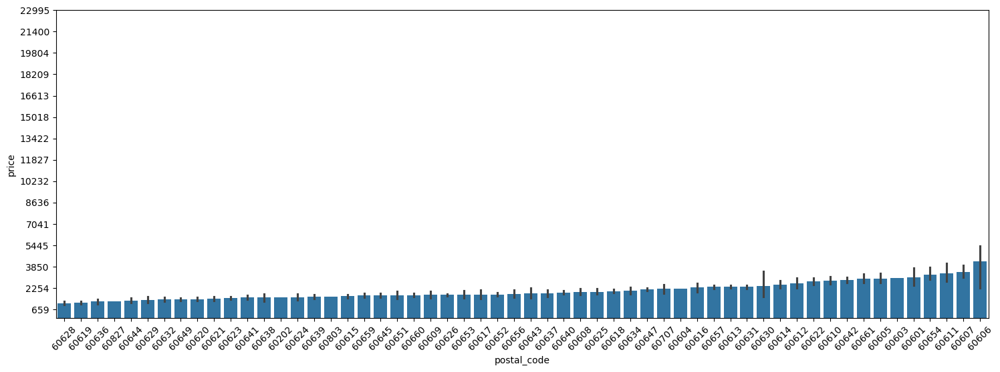

In [77]:
# сортируем postal_code по возрастанию среднего значения price
order = data.groupby('postal_code')['price'].mean().sort_values().index

plt.figure(figsize=(18, 6))
sns.barplot(
    x='postal_code',
    y='price',
    data=data,
    order=order
)

plt.yticks(
    np.linspace(data['price'].min(), data['price'].max(), 15)
)

# поворот подписей по X
plt.xticks(rotation=45)

plt.show()

Самые дорогие квартиры расположены в домах с индексом 60606, самые дешевые - в домах с индексом 60628

### Вывод

Исследовательский анализ данных показал, что данные о квартирах в Чикаго разнообразны по цене, площади и удобствам.

Основные наблюдения:

- Цены: от *\$659* до *\$60657*, среднее — *\$2309*. Большинство квартир расположено в диапазоне *\$1000* –*\$3000*. Реальные верхние значения не превышают *\$30000*, все что было выше - удалили, как выбросы.

- Количество спален 0–6 (0 — студии)

- Количество ванных комнат 1–4

- Площадь 181-4500 sqft, средняя - 862 sqft

- Большинство квартир без парковки, спортзала, лифта, бассейна и джакузи; разрешено проживание с домашними животными; отсутствует большинство кухонной техники и инфраструктуры.

Была обнаружена связь признаков с ценой:

- Цена растёт с увеличением площади и количества спален/ванных, но для больших квартир (4–6 спален) рост цены выражен слабо.

- Бинарные признаки вроде парковки, посудомойки, спортзала, бассейна, джакузи и офисного центра положительно влияют на цену.

- Некоторые признаки (разрешение на животных, курение, холодильник, плита и др.) почти не влияют на стоимость.

Далее обучим бейзлайн-модели на тренировочной выборке.

## Обучение базовых моделей (Baseline)

Нам предстоит решить задачу регрессии: предсказывать цены на аренду квартир в Чикаго.

В качестве базовых моделей (Baseline) рассмотрим:

- LinearRegression
- RandomForestRegressor
- CatBoostRegressor

Для оценки качества используем три метрики:

- MAE (средняя ошибка в долларах) — показывает, насколько в среднем модель промахивается в цене.
- RMSE — сильнее наказывает крупные ошибки и полезен для контроля выбросов.
- R² — измеряет долю объяснённой вариации и используется для сравнения моделей.

Основной метрикой будем считать MAE, так как она наиболее понятна и практична для задачи прогнозирования цен.

In [78]:
data_baseline = data.copy()

Заполним пропуски в колонке с площадью квартир sqft медианными значениями.

In [79]:
def fill_sqft_values(df):
    medians = df.groupby('beds')['sqft'].median()
    new_sqft = []

    for i, row in df.iterrows():
        if pd.isna(row['sqft']):
            new_sqft.append(medians[row['beds']])
        else:
            new_sqft.append(row['sqft'])
    
    df['sqft'] = new_sqft
    return df

# вызываешь на нужном датасете
data_baseline = fill_sqft_values(data_baseline)

In [80]:
data_baseline.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1988 entries, 0 to 2070
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   price                          1988 non-null   int64  
 1   beds                           1988 non-null   int64  
 2   baths                          1988 non-null   float64
 3   sqft                           1988 non-null   float64
 4   parking                        1988 non-null   int64  
 5   latitude                       1988 non-null   float64
 6   longitude                      1988 non-null   float64
 7   postal_code                    1988 non-null   int64  
 8   type                           1988 non-null   object 
 9   pets_friendly                  1988 non-null   int64  
 10  dishwasher                     1988 non-null   int64  
 11  microwave                      1988 non-null   int64  
 12  refrigerator                   1988 non-null   int64 

In [81]:
# Разделяем X и y
X = data_baseline.drop(columns=['price'])
y = data_baseline['price']

# Категориальные колонки для CatBoost (список строк)
cat_cols = list(X.select_dtypes(include=['object', 'category']).columns)

# Разделяем на тренировочную и тестовую выборку
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Для LinearRegression и RandomForest кодируем категориальные признаки
X_train_enc = X_train.copy()
X_test_enc = X_test.copy()

for col in cat_cols:
    le = LabelEncoder()
    X_train_enc[col] = le.fit_transform(X_train[col])
    X_test_enc[col] = le.transform(X_test[col])

# Словарь моделей
models = {
    "LinearRegression": LinearRegression(),
    "RandomForestRegressor": RandomForestRegressor(random_state=42),
    "CatBoostRegressor": CatBoostRegressor(verbose=0, random_state=42)
}

results = []

for name, model in models.items():
    if name == "CatBoostRegressor":
        model.fit(X_train, y_train, cat_features=cat_cols)
        y_train_pred = model.predict(X_train)
    else:
        model.fit(X_train_enc, y_train)
        y_train_pred = model.predict(X_train_enc)
    
    results.append({
        "Model": name,
        "MAE": mean_absolute_error(y_train, y_train_pred),
        "RMSE": mean_squared_error(y_train, y_train_pred) ** 0.5,
        "R2": r2_score(y_train, y_train_pred)
    })

# Итоговая таблица
results_df = pd.DataFrame(results)
display(results_df)

,Model,MAE,RMSE,R2
0,LinearRegression,421.337096,641.430596,0.601747
1,RandomForestRegressor,111.795905,206.782870,0.958611
2,CatBoostRegressor,142.613108,193.572103,0.963730


### Вывод

В качестве baseline обучили 3 модели на тренировочной выборке и получили результаты:

- Linear Regression

    - Ошибка в среднем *\$421* — довольно высокая.
    - RMSE ≈ *\$641* - большие ошибки встречаются часто.
    - R² ≈ 0.60 - модель объясняет только ~60% разброса цен.

- Random Forest

    - Средняя ошибка *\$112* — почти в 4 раза меньше, чем у LinearRegression.
    - RMSE ≈ *\$207* - крупных ошибок меньше.
    - R² ≈ 0.96 - почти идеально объясняет вариацию.

- CatBoost

    - Средняя ошибка *\$143* — чуть выше, чем у RF.
    - RMSE ≈ *\$194* — самая низкая среди всех моделей, значит, крупных ошибок меньше всего.
    - R² ≈ 0.96 - качество сопоставимо с RandomForest.

Линейная регрессия — слабый ориентир, показывает минимальный уровень.
RandomForest и CatBoost дают почти идеальную подгонку на трейне, но есть риск сильного переобучения.

Попытаемся улучить базовые модели:

- Создадим новые признаки (feature engineering)
- Соберем полноценный pipeline обработки данных
- Настроим гиперпараметры с помощью GridSearchCV

## Тюнинг моделей

### Создание новых признаков

В качестве новых признаков создадим:

- crime_nearby — количество зарегистрированных преступлений в непосредственной близости от квартиры;

- crime_density_level — уровень преступности в районе расположения квартиры;

- distance_to_center_miles — расстояние до центра Чикаго (в милях).

В качестве источника данных будет использован открытый датасет Crimes - 2001 to Present, предоставляемый порталом City of Chicago
https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-Present/ijzp-q8t2/about_data
Данные охватывают период с 2001 года по настоящее время. Для анализа мы ограничимся информацией за последние два года (2023–2025).

In [82]:
# Загрузим датасет с сайта City of Chicago
crimes_df = pd.read_csv('/Users/lena/chicago_rent_apartments/crimes_df.csv')
crimes_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,13933541,JJ373578,08/13/2025 12:00:00 AM,003XX N JEFFERSON ST,1320,CRIMINAL DAMAGE,TO VEHICLE,RESIDENCE,False,False,...,34.0,28.0,14,1172268.0,1902723.0,2025,08/20/2025 03:45:41 PM,41.888520,-87.642820,"(41.888519671, -87.64282025)"
1,13939669,JJ381503,08/13/2025 12:00:00 AM,078XX S KENTON AVE,1187,DECEPTIVE PRACTICE,STATE BENEFITS FRAUD,STREET,False,False,...,18.0,70.0,11,NaN,NaN,2025,08/20/2025 03:45:41 PM,NaN,NaN,NaN
2,13934025,JJ373349,08/13/2025 12:00:00 AM,017XX W 79TH ST,0281,CRIMINAL SEXUAL ASSAULT,NON-AGGRAVATED,ALLEY,False,False,...,17.0,71.0,02,1165859.0,1852302.0,2025,08/20/2025 03:45:41 PM,41.750298,-87.667791,"(41.750298063, -87.667790535)"
3,13935705,JJ376545,08/13/2025 12:00:00 AM,007XX E 111TH ST,2825,OTHER OFFENSE,HARASSMENT BY TELEPHONE,POLICE FACILITY / VEHICLE PARKING LOT,False,True,...,9.0,50.0,26,1183356.0,1831503.0,2025,08/20/2025 03:45:41 PM,41.692834,-87.604319,"(41.692833841, -87.60431945)"
4,13934092,JJ374530,08/13/2025 12:00:00 AM,027XX W ESTES AVE,0820,THEFT,$500 AND UNDER,STREET,False,False,...,50.0,2.0,06,1156926.0,1946986.0,2025,08/20/2025 03:45:41 PM,42.010305,-87.697957,"(42.010305124, -87.697956608)"


In [83]:
crimes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 906491 entries, 0 to 906490
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    906491 non-null  int64  
 1   Case Number           906491 non-null  object 
 2   Date                  906491 non-null  object 
 3   Block                 906491 non-null  object 
 4   IUCR                  906491 non-null  object 
 5   Primary Type          906491 non-null  object 
 6   Description           906491 non-null  object 
 7   Location Description  902416 non-null  object 
 8   Arrest                906491 non-null  bool   
 9   Domestic              906491 non-null  bool   
 10  Beat                  906491 non-null  int64  
 11  District              906491 non-null  int64  
 12  Ward                  906478 non-null  float64
 13  Community Area        906452 non-null  float64
 14  FBI Code              906491 non-null  object 
 15  

Напишем функцию, которая визуализирует цены на аренду квартир на карте Чикаго вместе с тепловой картой преступлений (HeatMap).

In [84]:
# Настройка диапазонов цен и цветов
price_bins = [
    (0, 1000, "#1f77b4"),
    (1001, 2000, "#ff7f0e"),
    (2001, 3000, "#2ca02c"),
    (3001, 4000, "#d62728"),
    (4001, 5000, "#9467bd"),
    (5001, 6000, "#8c564b"),
    (6001, 10000, "#e377c2"),
    (10001, float('inf'), "#7f7f7f")
]

# Функция для выбора цвета
def get_color(price, bins=price_bins):
    for low, high, color in bins:
        if low <= price <= high:
            return color
    return "#000000"

# Генерация компактной легенды цен
def generate_legend(bins):
    legend_html = '<div style="position: fixed; bottom: 120px; left: 50px; width: 140px; border:2px solid grey; z-index:9999; font-size:10px; background-color:white; padding:4px; line-height:12px;">'
    for low, high, color in bins:
        label = f"{int(low)}-{int(high) if high != float('inf') else '+'}"
        legend_html += f'<span style="display:inline-block; width:10px; height:10px; background:{color}; vertical-align:middle;"></span> {label}<br>'
    legend_html += '</div>'
    return legend_html

# Центр карты
map_center = [data['latitude'].mean(), data['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Берем случайную выборку 10 квартир для отображения
data_sample = data.sample(n=10, random_state=42)

# Добавление квартир
for idx, row in data_sample.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=get_color(row['price']),
        fill=True,
        fill_color=get_color(row['price']),
        fill_opacity=0.7,
        tooltip=f"Цена: {row['price']}$",
        popup=f"{row['price']}$, {row['beds']} bd / {row['baths']} ba, {row['sqft']} sqft"
    ).add_to(m)

# Добавление HeatMap преступлений (тоже случайная выборка 10 точек)
crime_sample = crimes_df.sample(n=10, random_state=42)
crime_coords = crime_sample[['Latitude', 'Longitude']].dropna().values.tolist()
HeatMap(
    crime_coords,
    radius=8,
    blur=6,
    max_zoom=12,
    gradient={0.2: "green", 0.4: "yellow", 0.6: "orange", 0.8: "red", 1: "darkred"}
).add_to(m)

# Добавление легенды цен
m.get_root().html.add_child(folium.Element(generate_legend(price_bins)))

# Горизонтальная легенда уровня преступности
legend_crime = """
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 250px;
    height: 20px;
    border:2px solid grey;
    z-index:9999;
    background: linear-gradient(to right, green, yellow, orange, red, darkred);
    padding: 2px;
"></div>
<div style="
    position: fixed;
    bottom: 30px;
    left: 50px;
    width: 250px;
    z-index:9999;
    font-size:12px;
    text-align:center;
    font-weight:bold;
">
Уровень преступности
</div>
"""
m.get_root().html.add_child(folium.Element(legend_crime))

display(m)

Признак уровня преступности рядом с квартирой может быть полезен для моделей предсказания цен на аренду, поскольку стоимость жилья напрямую зависит от качества района. Люди обычно готовы платить больше за квартиры в безопасных районах и меньше — в неблагополучных, поэтому уровень преступности часто обратнопропорционален цене.

Добавление этого признака позволит моделям учитывать локальные различия между районами, снизит ошибку предсказания, особенно для квартир в районах с высокой вариативностью безопасности, и создаст более информативный контекст, который сложно учесть, используя только координаты.

Напишем функцию, которая вычисляет количество преступлений рядом с каждой квартирой и сохраняет результат в новом признаке crime_nearby.

Для этого берём координаты квартир (latitude и longitude) из датасета с ценами на аренду (data) и координаты преступлений из датасета преступлений в Чикаго (crimes_df). Создаём структуру данных KDTree для быстрого поиска ближайших точек — в данном случае ближайших преступлений к каждой квартире. Для каждой квартиры считаем, сколько преступлений находится в радиусе ~0.62 мили (примерно 1 км), используя соответствующее преобразование градусов в мили.

Результат сохраним в колонку crime_nearby, которая отражает локальный уровень преступности для каждой квартиры.

In [85]:
# Координаты квартир
apt_coords = data[['latitude', 'longitude']].values

# Координаты преступлений: убираем NaN
crime_coords = crimes_df[['Latitude', 'Longitude']].replace([np.inf, -np.inf], np.nan)
crime_coords = crime_coords.dropna().values

# Быстрое соседство через KDTree
tree = cKDTree(crime_coords)

# Считаем кол-во преступлений в радиусе 1 км (~0.01 градуса)
counts = []
radius = 0.01  # ~1 км, зависит от широты
for lat, lon in apt_coords:
    idxs = tree.query_ball_point([lat, lon], r=radius)
    counts.append(len(idxs))

data['crime_nearby'] = counts

In [86]:
data.head()

,price,beds,baths,sqft,parking,latitude,longitude,postal_code,type,pets_friendly,...,rec_room,smoke_free,pool,playground,heat,granite_countertops,ceiling_fans,bicycle_storage,quartz_countertops,crime_nearby
0,1455,1,1.0,NaN,0,42.017309,-87.68180,60645,apartment,1,...,0,0,0,0,1,0,0,0,0,5863
1,2600,1,1.0,675.0,1,41.855907,-87.62507,60616,apartment,1,...,0,0,1,0,0,1,0,1,0,8268
2,1395,0,1.0,NaN,0,41.901694,-87.63034,60610,studio,1,...,0,0,0,0,1,0,0,1,0,18395
3,1445,0,1.0,NaN,0,41.902461,-87.62952,60610,studio,1,...,0,0,0,0,1,0,0,1,0,16960
4,1525,1,1.0,659.0,0,41.802219,-87.59230,60615,apartment,1,...,0,0,0,0,0,0,0,1,0,8468


Рассмотрим новый признак 'crime_nearby'

In [87]:
data['crime_nearby'].describe()

count     1988.000000
mean      8650.469819
std       5458.514837
min          0.000000
25%       5335.750000
50%       7532.000000
75%      10794.000000
max      37442.000000
Name: crime_nearby, dtype: float64

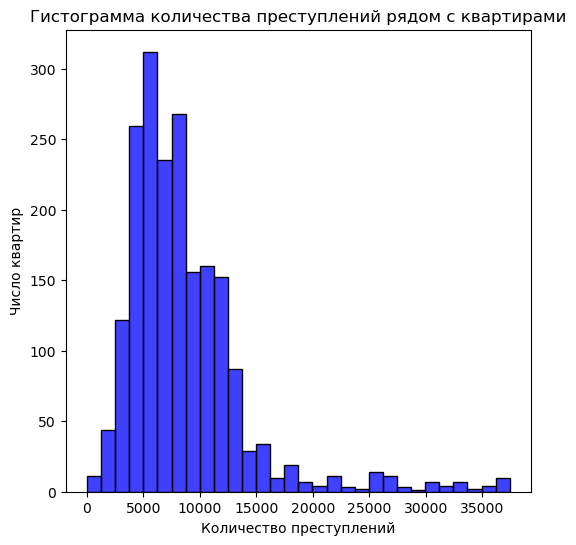

In [88]:
plt.figure(figsize=(6,6))
sns.histplot(data['crime_nearby'], bins=30, kde=False, color='blue')
plt.title("Гистограмма количества преступлений рядом с квартирами")
plt.xlabel("Количество преступлений")
plt.ylabel("Число квартир")
plt.show()

В среднем около 8–9 тысяч преступлений зарегистрировано в радиусе около 1 км вокруг квартиры (за последние 2 года 2023-2025).

Есть квартиры в полностью безопасных районах (или в местах, где данные о преступлениях отсутствуют), где количество преступлений 0. Встречаются районы с очень высоким уровнем преступности, где зарегистрирован максимум преступлений - 37442.

Проверим взаимосвязь нового признака с целевой переменной 'price'.

Сгруппируем данные, чтобы увидеть среднюю цену квартир для разных уровней преступности.

In [89]:
grouped_data = data.groupby('crime_nearby')['price'].mean().reset_index()
sorted_data = grouped_data.sort_values(by='price', ascending=False)
sorted_data

,crime_nearby,price
1482,18457,15000.00
1342,12269,13585.00
1451,14842,8850.00
14,1397,8000.00
1431,13813,7800.00
...,...,...
313,4605,746.75
1270,11417,740.00
293,4477,726.00
1001,8736,725.00


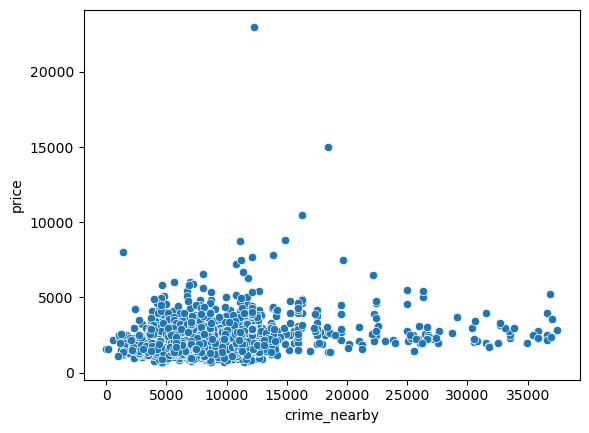

In [90]:
# Взаимосвязь количества преступлений и цены
sns.scatterplot(x='crime_nearby', y='price', data=data)
plt.show()

Нет простой линейной зависимости между количеством преступлений и ценой аренды.
Например, самая высокая цена *\$15000* соответствует crime_nearby 18457, а низкая цена *\$705* соответствует crime_nearby 9775.

Это значит, что цена квартиры не зависит только от количества преступлений рядом.

Присутствуют выбросы и аномалии:

- Некоторые районы с высоким уровнем преступности могут иметь дорогие квартиры (например, элитные квартиры в центральных районах с высокой преступностью, но престижным окружением).

- И наоборот, районы с низкой преступностью могут иметь дешёвые квартиры (например, отдалённые или малоразвитые районы).

Таким образом, признак crime_nearby информативен, но не единственный фактор, влияющий на цену.

Создадим новый категориальный признак crime_density_level, который отражает уровень плотности преступлений вокруг каждой квартиры.

Crime_nearby — числовой признак с большой дисперсией и скошенным распределением. Преобразование количества преступлений в уровни (категории) делает данные более удобными для модели, особенно для деревьев решений или градиентных моделей, и помогает лучше уловить нелинейные зависимости между безопасностью района и ценой аренды.

Напишем функцию crime_level(x), которая присваивает категорию в зависимости от значения crime_nearby:

- 0 — нет преступлений рядом
- 1 — низкий уровень (до 25-го перцентиля)
- 2 — средне-низкий (25–50%)
- 3 — средне-высокий (50–75%)
- 4 — высокий уровень преступности (> 75%)

In [91]:
def crime_level(x):
    if x == 0:
        return 0
    elif x <= 5335:       # до 25-го перцентиля
        return 1
    elif x <= 7532:       # 25-50
        return 2
    elif x <= 10794:      # 50-75
        return 3
    else:                 # > 75
        return 4

data['crime_density_level'] = data['crime_nearby'].apply(crime_level)

In [92]:
data.head()

,price,beds,baths,sqft,parking,latitude,longitude,postal_code,type,pets_friendly,...,smoke_free,pool,playground,heat,granite_countertops,ceiling_fans,bicycle_storage,quartz_countertops,crime_nearby,crime_density_level
0,1455,1,1.0,NaN,0,42.017309,-87.68180,60645,apartment,1,...,0,0,0,1,0,0,0,0,5863,2
1,2600,1,1.0,675.0,1,41.855907,-87.62507,60616,apartment,1,...,0,1,0,0,1,0,1,0,8268,3
2,1395,0,1.0,NaN,0,41.901694,-87.63034,60610,studio,1,...,0,0,0,1,0,0,1,0,18395,4
3,1445,0,1.0,NaN,0,41.902461,-87.62952,60610,studio,1,...,0,0,0,1,0,0,1,0,16960,4
4,1525,1,1.0,659.0,0,41.802219,-87.59230,60615,apartment,1,...,0,0,0,0,0,0,1,0,8468,3


Рассмотрим новый признак 'crime_density_level'

In [93]:
# Сгруппируем по уровню преступности и посчитаем количество квартир
crime_counts = data.groupby('crime_density_level').size().reset_index(name='count')
crime_counts

,crime_density_level,count
0,0,1
1,1,496
2,2,498
3,3,496
4,4,497


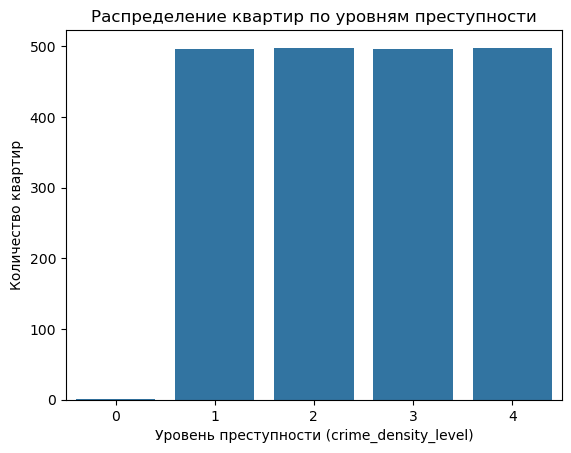

In [94]:
# Построим столбчатую диаграмму barplot
counts = data['crime_density_level'].value_counts().sort_index()

sns.barplot(x=counts.index, y=counts.values)
plt.xlabel('Уровень преступности (crime_density_level)')
plt.ylabel('Количество квартир')
plt.title('Распределение квартир по уровням преступности')
plt.show()

Данные распределены практически равномерно между уровнями 1–4, что логично, так как границы категорий задавались по квартилям.

Уровень 0 почти не встречается, значит почти все квартиры находятся в районах с хотя бы минимальным количеством преступлений.

Такой сбалансированный признак будет полезен для моделей, так как каждая категория содержит достаточное количество примеров.

Проверим взаимосвязь нового признака с целевой переменной 'price'.

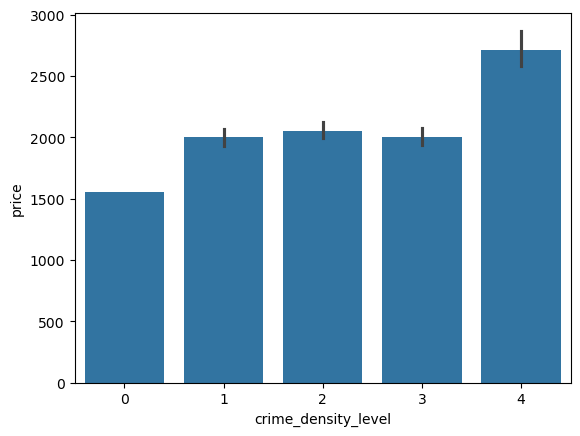

In [95]:
sns.barplot(x='crime_density_level', y='price', data=data)
plt.show()

Цены на квартиры с уровнями преступности 1–3 примерно одинаковые, значительных различий нет. Это указывает на то, что для большинства районов с умеренным уровнем преступности безопасность не является решающим фактором цены.

При этом для квартир с высоким уровнем преступности наблюдается наибольший разброс цен, включая очень дорогие варианты. Это может объясняться тем, что в центральных или престижных районах, несмотря на высокий уровень зарегистрированных преступлений, есть элитные квартиры с высокой стоимостью, близкие к центру и с развитой инфраструктурой.

Таким образом, crime_density_level не демонстрирует строгой обратной зависимости с ценой, но всё же добавляет важный контекст безопасности района.

Модели, учитывающие несколько признаков одновременно, смогут правильно уловить сложные и нелинейные зависимости, например, деревья решений или градиентные модели.

Создадим новый признак distance_to_center_miles, который показывает расстояние каждой квартиры до центра Чикаго в милях.

Расстояние до центра города — один из ключевых факторов, влияющих на цену аренды. Квартиры ближе к центру обычно дороже, а удалённые районы — дешевле.

Этот признак помогает моделям учесть влияние расположения на цену и улучшить точность предсказаний.

Создадим функцию haversine_distance_miles, которая рассчитывает расстояние между двумя точками на сфере (Земле) по их широте и долготе, используя формулу гаверсинуса (Haversine).

Радиус Земли задаём в милях (3958.8 миль). Для каждой квартиры вычисляем расстояние до центра Чикаго. Центр Чикаго условно можно взять как 41.8781, -87.6298 (координаты Millennium Park / Downtown).

В итоге каждая квартира получает числовой признак, отражающий близость к центру, который удобно использовать в модели предсказания цен на аренду.

In [96]:
# Расстояние до центра Чикаго в милях

def haversine_distance_miles(lat1, lon1, lat2, lon2):
    R = 3958.8  # радиус Земли в милях
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    dphi = np.radians(lat2 - lat1)
    dlambda = np.radians(lon2 - lon1)

    a = np.sin(dphi/2)**2 + np.cos(phi1) * np.cos(phi2) * np.sin(dlambda/2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

# координаты центра Чикаго
chi_lat, chi_lon = 41.8781, -87.6298

# добавляем колонку с расстоянием в милях
data['distance_to_center_miles'] = haversine_distance_miles(
    data['latitude'], data['longitude'], chi_lat, chi_lon
)

In [97]:
data.head()

,price,beds,baths,sqft,parking,latitude,longitude,postal_code,type,pets_friendly,...,pool,playground,heat,granite_countertops,ceiling_fans,bicycle_storage,quartz_countertops,crime_nearby,crime_density_level,distance_to_center_miles
0,1455,1,1.0,NaN,0,42.017309,-87.68180,60645,apartment,1,...,0,0,1,0,0,0,0,5863,2,9.982822
1,2600,1,1.0,675.0,1,41.855907,-87.62507,60616,apartment,1,...,1,0,0,1,0,1,0,8268,3,1.552599
2,1395,0,1.0,NaN,0,41.901694,-87.63034,60610,studio,1,...,0,0,1,0,0,1,0,18395,4,1.630443
3,1445,0,1.0,NaN,0,41.902461,-87.62952,60610,studio,1,...,0,0,1,0,0,1,0,16960,4,1.683263
4,1525,1,1.0,659.0,0,41.802219,-87.59230,60615,apartment,1,...,0,0,0,0,0,1,0,8468,3,5.586995


Рассмотрим новый признак 'distance_to_center_miles'

In [98]:
data['distance_to_center_miles'].describe()

count    1988.000000
mean        5.321270
std         2.860098
min         0.071263
25%         3.096693
50%         5.332993
75%         7.328076
max        15.560897
Name: distance_to_center_miles, dtype: float64

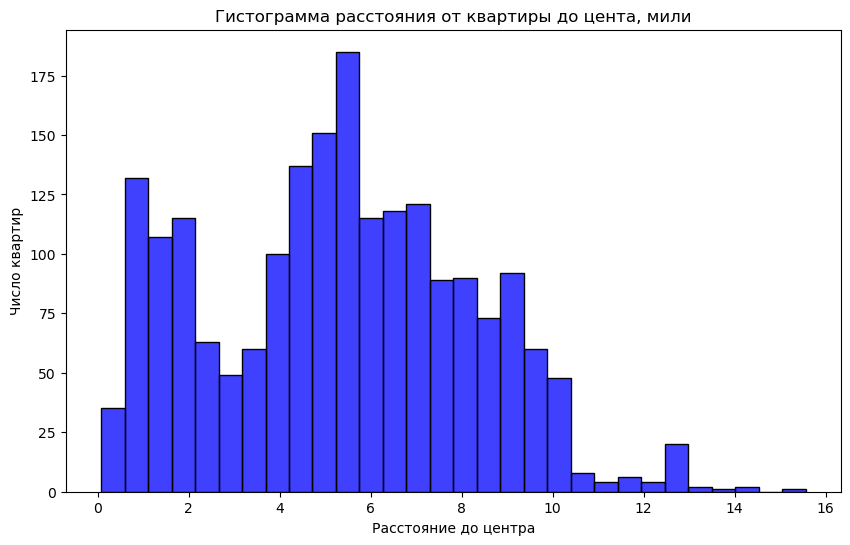

In [99]:
plt.figure(figsize=(10,6))
sns.histplot(data['distance_to_center_miles'], bins=30, kde=False, color='blue')
plt.title("Гистограмма расстояния от квартиры до цента, мили")
plt.xlabel("Расстояние до центра")
plt.ylabel("Число квартир")
plt.show()

- Среднее расстояние до центра Чикаго — около 5.3 миль.
- Большинство квартир находятся в радиусе 3–7 миль от центра (25–75% квартиль).
- Минимальное расстояние — 0.07 мили (почти в центре), максимальное — 15.56 миль (далёкие районы).

Рассмотрим зависимость между признаком distance_to_center_miles и целевой переменной price

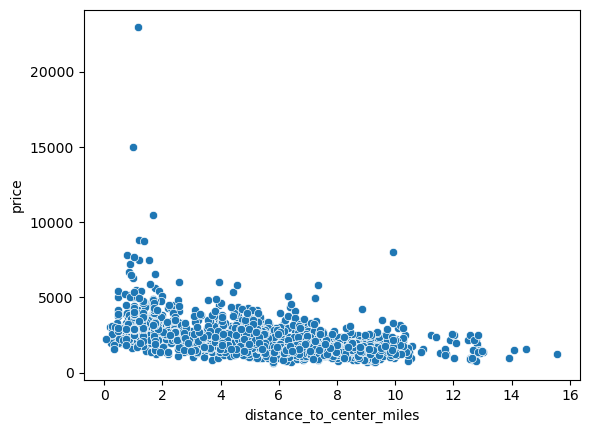

In [100]:
# Построим график scatterplot 
sns.scatterplot(x='distance_to_center_miles', y='price', data=data)
plt.show()

Наблюдается отрицательная зависимость между расстоянием до центра и ценой: чем ближе квартира к центру, тем выше её цена. Такой признак будет очень полезен для обучения моделей.

In [101]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1988 entries, 0 to 2070
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   price                          1988 non-null   int64  
 1   beds                           1988 non-null   int64  
 2   baths                          1988 non-null   float64
 3   sqft                           993 non-null    float64
 4   parking                        1988 non-null   int64  
 5   latitude                       1988 non-null   float64
 6   longitude                      1988 non-null   float64
 7   postal_code                    1988 non-null   int64  
 8   type                           1988 non-null   object 
 9   pets_friendly                  1988 non-null   int64  
 10  dishwasher                     1988 non-null   int64  
 11  microwave                      1988 non-null   int64  
 12  refrigerator                   1988 non-null   int64 

Всего 32 колонки с признаками и 1988 строк.

Проверим обновленный датасет на наличие явных дублей

In [102]:
data.duplicated().sum()

np.int64(0)

### Проверка значений на мультиколлинеарность

Проверим обновленный датасет на мультиколлинеарность

interval columns not set, guessing: ['price', 'beds', 'baths', 'sqft', 'parking', 'latitude', 'longitude', 'postal_code', 'pets_friendly', 'dishwasher', 'microwave', 'refrigerator', 'stainless_steel_appliances', 'stove', 'gym', 'elevator', 'office_center_conference_room', 'on_site_laundry', 'hot_tub', 'rec_room', 'smoke_free', 'pool', 'playground', 'heat', 'granite_countertops', 'ceiling_fans', 'bicycle_storage', 'quartz_countertops', 'crime_nearby', 'crime_density_level', 'distance_to_center_miles']


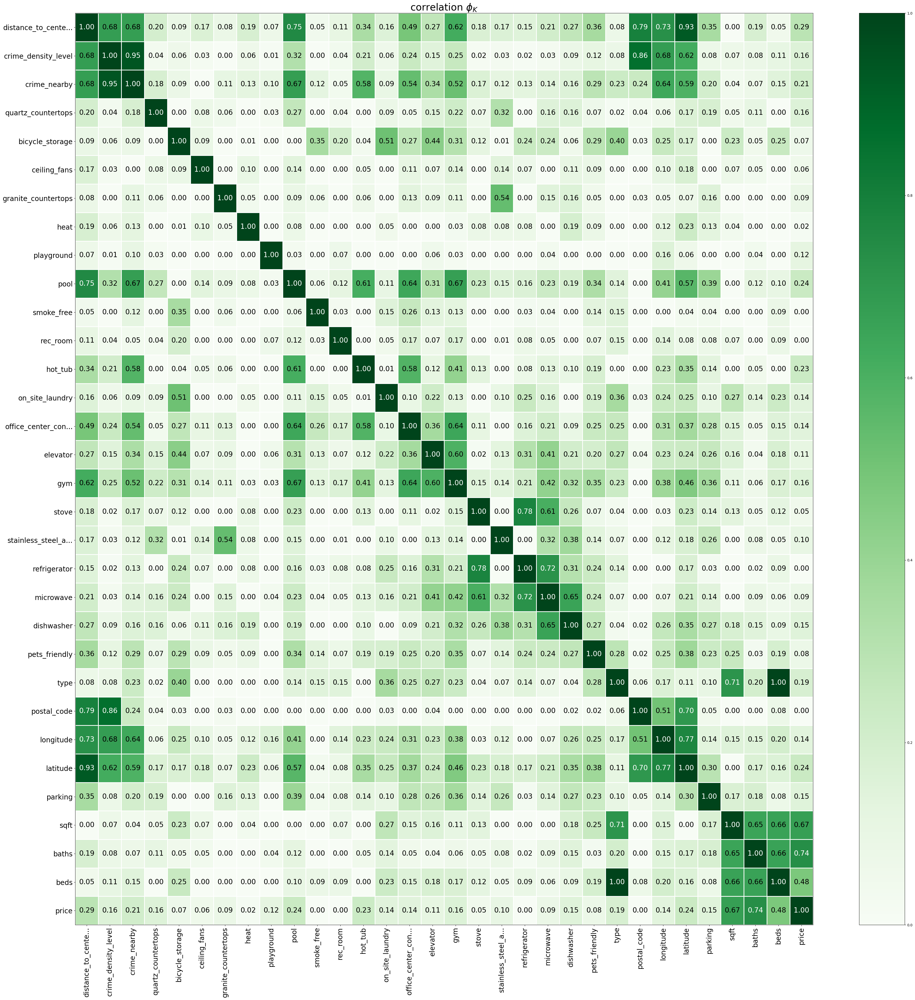

In [103]:
phik_overview = data.phik_matrix()

plot_correlation_matrix(phik_overview.values,
                        x_labels=phik_overview.columns,
                        y_labels=phik_overview.index,
                        vmin=0, vmax=1, color_map="Greens",
                        title=r"correlation $\phi_K$",
                        fontsize_factor=2,
                        figsize=(40, 40))
plt.tight_layout();

Обнаружена сильная корреляция между признаками:

- postal_code и crime_density_level (0,86)
- distance_to_center_miles и latitude (0,93)
- crime_density_level и crime_nearby (0,95)
- beds и type (1)

Для линейной регрессии высокие корреляции могут вызвать мультиколлинеарность, что приведёт к нестабильным коэффициентам и снижению интерпретируемости модели. Поэтому удаляем дублирующие признаки:

- Оставляем: distance_to_center_miles, crime_density_level, beds — они несут основную информацию о расположении, безопасности и типе жилья.
- Удаляем: postal_code, crime_nearby, type.

Для деревьев решений и градиентных моделей мультиколлинеарность менее критична, модели сами выбирают важные признаки. Поэтому для них можно оставить все признаки, чтобы модель использовала всю доступную информацию.

### Проверка важности признаков (Mutual Information)

Дополнительно проверим важность признаков (Mutual Information) до обучения моделей, чтобы понять, какие признаки потенциально несут полезную информацию о таргете ещё до запуска сложных алгоритмов.

- Измеряет, насколько знание признака уменьшает неопределённость таргета.
- Работает и с нелинейными зависимостями, и с категориальными признаками. Иногда Mutual Information выделяет признаки, которые не линейно влияют на таргет, и которые классические корреляции не видят.
- Помогает определить признаки, которые не несут полезной информации о целевой переменной

postal_code                      0.354743
latitude                         0.337866
distance_to_center_miles         0.310705
longitude                        0.245362
beds                             0.215615
baths                            0.200160
sqft                             0.149019
crime_nearby                     0.134598
type                             0.102674
dishwasher                       0.095591
pool                             0.060662
crime_density_level              0.058268
parking                          0.055460
gym                              0.053648
pets_friendly                    0.037960
stainless_steel_appliances       0.035207
hot_tub                          0.031449
on_site_laundry                  0.025260
heat                             0.023540
microwave                        0.022785
quartz_countertops               0.019007
office_center_conference_room    0.016796
elevator                         0.012765
ceiling_fans                     0

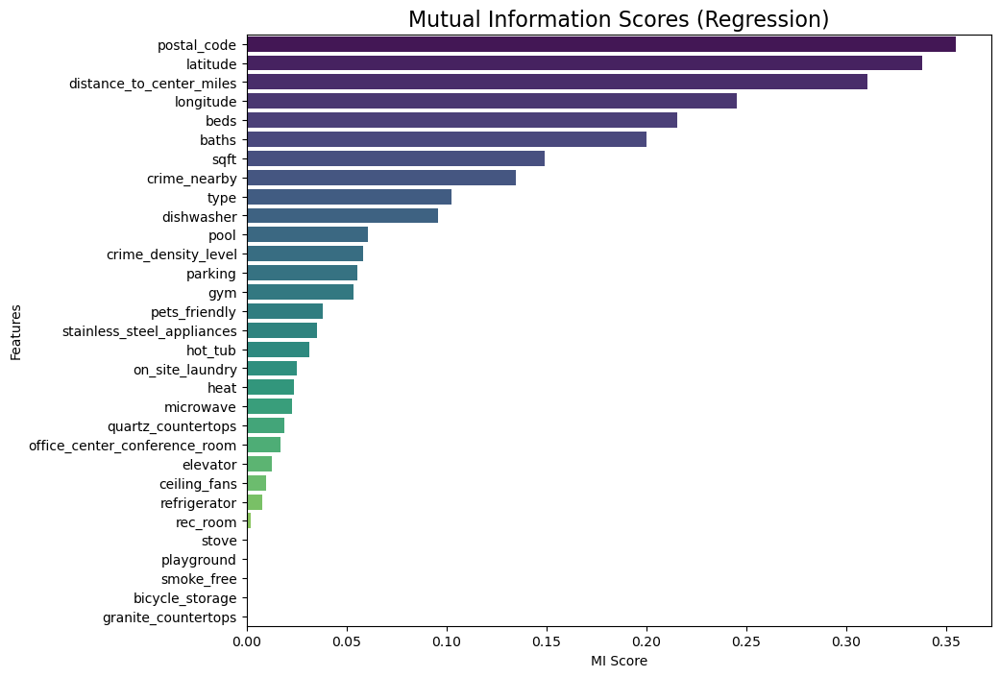

In [104]:
target_col = 'price'
df_enc = data.copy() 

# Определяем признаки и целевую переменную
exclude_cols = [target_col]
all_features = [c for c in df_enc.columns if c not in exclude_cols]

# Разделяем числовые и категориальные признаки
num_features = df_enc[all_features].select_dtypes(include=['number']).columns.tolist()
cat_features = [c for c in all_features if c not in num_features]

# Заполняем пропуски средним и наиболее часто встречающимися значениями
num_imputer = SimpleImputer(strategy='mean')
df_enc[num_features] = num_imputer.fit_transform(df_enc[num_features])

cat_imputer = SimpleImputer(strategy='most_frequent')
df_enc[cat_features] = cat_imputer.fit_transform(df_enc[cat_features])

# Кодируем категориальные признаки
for col in cat_features:
    df_enc[col] = LabelEncoder().fit_transform(df_enc[col].astype(str))

# Целевая переменная y
y = df_enc[target_col]

# Mutual Information
mi = mutual_info_regression(
    df_enc[all_features],
    y,
    discrete_features=[df_enc[c].dtype==int for c in all_features],
    random_state=42
)

# Сортируем и визуализируем признаки
mi_series = pd.Series(mi, index=all_features).sort_values(ascending=False)
print(mi_series)

plt.figure(figsize=(10, 8))
sns.barplot(x=mi_series.values, y=mi_series.index, palette="viridis")
plt.title("Mutual Information Scores (Regression)", fontsize=16)
plt.xlabel("MI Score")
plt.ylabel("Features")
plt.show()

### Отбор признаков

Удалим менее информативные признаки из датасета

In [105]:
drop_cols = ['ceiling_fans', 'refrigerator', 'rec_room', 'stove', 'playground', 'smoke_free',
            'bicycle_storage', 'granite_countertops']
data = data.drop(columns=drop_cols)

In [106]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1988 entries, 0 to 2070
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   price                          1988 non-null   int64  
 1   beds                           1988 non-null   int64  
 2   baths                          1988 non-null   float64
 3   sqft                           993 non-null    float64
 4   parking                        1988 non-null   int64  
 5   latitude                       1988 non-null   float64
 6   longitude                      1988 non-null   float64
 7   postal_code                    1988 non-null   int64  
 8   type                           1988 non-null   object 
 9   pets_friendly                  1988 non-null   int64  
 10  dishwasher                     1988 non-null   int64  
 11  microwave                      1988 non-null   int64  
 12  stainless_steel_appliances     1988 non-null   int64 

Проверим на наличие явных дубликатов

In [107]:
data.duplicated().sum()

np.int64(0)

In [108]:
# Выведем итоговые признаки, которые будем использовать для обучения моделей
data.columns

Index(['price', 'beds', 'baths', 'sqft', 'parking', 'latitude', 'longitude',
       'postal_code', 'type', 'pets_friendly', 'dishwasher', 'microwave',
       'stainless_steel_appliances', 'gym', 'elevator',
       'office_center_conference_room', 'on_site_laundry', 'hot_tub', 'pool',
       'heat', 'quartz_countertops', 'crime_nearby', 'crime_density_level',
       'distance_to_center_miles'],
      dtype='object')

### Оптимизация моделей с использованием Pipeline и GridSearchCV

Обучим 3 модели с помощью облегченной версии Pipeline и GridSearchCV:

- LinearRegression
- RandomForestRegressor
- CatBoostRegressor

Для оценки качества будем использовать метрики:

- MAE (средняя ошибка в долларах) — показывает, насколько в среднем модель промахивается в цене.
- RMSE — сильнее наказывает крупные ошибки и полезен для контроля выбросов.
- R² — измеряет долю объяснённой вариации и используется для сравнения моделей.

Основной метрикой будем считать MAE, так как она наиболее понятна и практична для задачи прогнозирования цен.

Линейная регрессия служит базовой моделью — для неё исключаются коррелированные признаки, чтобы избежать мультиколлинеарности.
Для моделей на деревьях (Random Forest, CatBoost) мы используем более гибкий препроцессинг и настраиваем гиперпараметры. Выбор именно таких значений связан с размером выборки: он относительно небольшой, поэтому важно снизить риск переобучения. Для этого мы ограничиваем глубину деревьев, увеличиваем минимальное число объектов в листьях и узлах, используем регуляризацию и более низкие скорости обучения.Таким образом, модели остаются достаточно гибкими, но не подстраиваются слишком сильно под шум в данных. Качество проверяется через кросс-валидацию с большим числом фолдов, что даёт более надёжную оценку.

In [109]:
# Разделяем X и y
target = 'price'
X = data.drop(columns=target)
y = data[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Категориальные и числовые признаки
num_features = [
    'beds', 'baths', 'sqft', 'parking', 'latitude', 'longitude',
    'postal_code', 'pets_friendly', 'dishwasher', 'microwave',
    'stainless_steel_appliances', 'gym', 'elevator',
    'office_center_conference_room', 'on_site_laundry', 'hot_tub', 'pool',
    'heat', 'quartz_countertops', 'crime_nearby', 'crime_density_level',
    'distance_to_center_miles'
]
cat_features = ['type']

# Препроцессоры
num_transformer_lr = Pipeline([
    ('imputer', IterativeImputer(random_state=42)),
    ('scaler', StandardScaler())
])

preprocessor_lr = ColumnTransformer([
    ('num', num_transformer_lr, [c for c in num_features if c not in ['postal_code', 'crime_nearby', 'type']])
])

num_transformer_tree = Pipeline([('imputer', SimpleImputer(strategy='median'))])
cat_transformer_tree = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor_tree = ColumnTransformer([
    ('num', num_transformer_tree, num_features),
    ('cat', cat_transformer_tree, cat_features)
])

# Модели и гиперпараметры
pipeline_lr = Pipeline([('preprocessor', preprocessor_lr), ('linear', LinearRegression())])
param_lr = {}

pipeline_rf = Pipeline([('preprocessor', preprocessor_tree), ('rf', RandomForestRegressor(random_state=42))])
param_rf = {
    'rf__n_estimators': [100, 200],
    'rf__max_depth': [3, 4, 5],
    'rf__min_samples_split': [10, 20],
    'rf__min_samples_leaf': [5, 10]
}

pipeline_cb = Pipeline([('preprocessor', preprocessor_tree), 
                        ('cb', CatBoostRegressor(
                            verbose=0,
                            random_state=42
                        ))])
param_cb = {
    'cb__iterations': [1000, 1500],
    'cb__depth': [3, 4, 5],
    'cb__learning_rate': [0.01, 0.03],
    'cb__l2_leaf_reg': [5, 7]
}

# KFold
cv = KFold(n_splits=10, shuffle=True, random_state=42)

grid_lr = GridSearchCV(pipeline_lr, param_grid=param_lr, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_rf = GridSearchCV(pipeline_rf, param_grid=param_rf, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_cb = GridSearchCV(pipeline_cb, param_grid=param_cb, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-1)

# Обучение моделей
print("Обучаем Linear Regression...")
grid_lr.fit(X_train, y_train)

print("Обучаем Random Forest...")
grid_rf.fit(X_train, y_train)

print("Обучаем CatBoost...")
grid_cb.fit(X_train, y_train)

# Метрики
def get_cv_metrics(grid, X, y, cv=cv):
    best_model = grid.best_estimator_
    y_pred = cross_val_predict(best_model, X, y, cv=cv)
    mae = mean_absolute_error(y, y_pred)
    rmse = mean_squared_error(y, y_pred) ** 0.5
    r2 = r2_score(y, y_pred)
    return mae, rmse, r2

mae_lr, rmse_lr, r2_lr = get_cv_metrics(grid_lr, X_train, y_train)
mae_rf, rmse_rf, r2_rf = get_cv_metrics(grid_rf, X_train, y_train)
mae_cb, rmse_cb, r2_cb = get_cv_metrics(grid_cb, X_train, y_train)

Обучаем Linear Regression...
Обучаем Random Forest...
Обучаем CatBoost...


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1338
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2193.707897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-ch

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2178.035639
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2194.114605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 1431, n

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1335
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2197.183788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1335
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2197.183788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1339
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2181

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1334
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2194

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1333
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2196.111111
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Start training from score 2194.114605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1338
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2188.640811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1332
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2173.887491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2181.909853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Total Bins 1336
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2178.035639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1338
[LightGBM] [Info] Number of data points in the train set: 1431, number of used features: 24
[LightGBM] [Info] Start training from score 2193.707897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [110]:
# Итоговая таблица результатов

results_df = pd.DataFrame([
    {"Model": "LinearRegression", "MAE": mae_lr, "RMSE": rmse_lr, "R2": r2_lr, "Best_Params": grid_lr.best_params_},
    {"Model": "RandomForestRegressor", "MAE": mae_rf, "RMSE": rmse_rf, "R2": r2_rf, "Best_Params": grid_rf.best_params_},
    {"Model": "CatBoostRegressor", "MAE": mae_cb, "RMSE": rmse_cb, "R2": r2_cb, "Best_Params": grid_cb.best_params_}
])

pd.set_option('display.max_colwidth', None)
display(results_df)

,Model,MAE,RMSE,R2,Best_Params
0,LinearRegression,373.859928,603.374995,0.647601,{}
1,RandomForestRegressor,354.624348,568.969341,0.686644,"{'rf__max_depth': 5, 'rf__min_samples_leaf': 5, 'rf__min_samples_split': 10, 'rf__n_estimators': 200}"
2,CatBoostRegressor,290.228898,508.006673,0.750196,"{'cb__depth': 5, 'cb__iterations': 1500, 'cb__l2_leaf_reg': 5, 'cb__learning_rate': 0.03}"


После построения бейзлайна и дальнейшей работы с признаками и гиперпараметрами качество моделей заметно улучшилось.

- Линейная регрессия показала прирост по всем метрикам: MAE снизился с ~421 до ~374, R² вырос с 0.60 до 0.65. Это подтверждает, что удаление мультиколлинеарных признаков и добавление новых факторов (например, расстояния до центра) сделали модель более информативной, даже без сложных настроек.

- Random Forest после тюнинга стал менее склонен к переобучению: R² упал с 0.96 (очевидный оверфит бейзлайна) до 0.69, но MAE и RMSE в кросс-валидации теперь ближе к реальным ожиданиям. Настройка глубины деревьев и минимальных размеров узлов позволила сбалансировать точность и устойчивость.

- CatBoost стал лидером. Алгоритм настраивался с учётом небольшой выборки (ограниченная глубина деревьев, регуляризация, пониженный learning rate), что дало более высокое качество без переобучения. CatBoost показал минимальную ошибку (MAE ~290, RMSE ~508) и лучший R² (0.75).

Модель CatBoost возьмем для предсказания цен на тестовой выборке.

### Вывод

На этапе тюнинга мы расширили признаки и улучшили качество моделей за счёт добавления новых информативных факторов:

- crime_nearby — количество зарегистрированных преступлений в радиусе ~1 км от квартиры;

- crime_density_level — категориальный уровень преступности вокруг квартиры;

- distance_to_center_miles — расстояние до центра Чикаго.

Признаки уровня преступности и близости к центру помогают моделям учитывать локальные различия между районами, что особенно важно для сложных моделей, таких как деревья решений и градиентные ансамбли. При этом для линейной регрессии мы удалили коррелированные и менее информативные признаки, чтобы избежать мультиколлинеарности и повысить интерпретируемость модели.

В ходе тюнинга также применялся продуманный подбор гиперпараметров: ограничение глубины деревьев, увеличение минимального числа объектов в узлах и листьях, регуляризация и снижение learning rate. Это было важно для небольшой выборки — такие настройки снижали риск переобучения, сохраняя гибкость моделей. Качество оценивалось через кросс-валидацию с 10 фолдами, что обеспечило надёжную и стабильную оценку.

Результаты показали заметное улучшение качества:

Линейная регрессия: MAE снизился с ~421 до ~374, R² вырос с 0.60 до 0.65, что подтверждает эффективность добавленных признаков и устранение корреляций.

Random Forest: R² снизился с 0.96 до 0.69, что устранило явный переобучение бейзлайна, при этом MAE и RMSE стали более реалистичными.

CatBoost: модель достигла высокого качества без переобучения, показала лучшую точность: MAE ~290, RMSE ~508, R² ~0.75.

Таким образом, CatBoost стала предпочтительной моделью для предсказания цен на тестовой выборке, так как сочетает высокую точность и устойчивость к переобучению.

## Финальное предсказание на тестовой выборке

Предскажем цены на аренду квартир на тестовой выборке

In [111]:
# Лучшая модель CatBoost
best_model = grid_cb.best_estimator_

# Предсказания на тесте
y_pred_test = best_model.predict(X_test)

# Метрики на тесте
mae_test = mean_absolute_error(y_test, y_pred_test)
rmse_test = mean_squared_error(y_test, y_pred_test) ** 0.5
r2_test = r2_score(y_test, y_pred_test)

# Таблица с итоговыми метриками
test_metrics_df = pd.DataFrame([
    {
        "Model": "CatBoostRegressor",
        "MAE": mae_test,
        "RMSE": rmse_test,
        "R2": r2_test
    }
])

display(test_metrics_df)

,Model,MAE,RMSE,R2
0,CatBoostRegressor,305.83002,839.501836,0.667706


CatBoost, показавший наилучшие результаты при кросс-валидации на трейне (MAE ≈ 290, RMSE ≈ 508, R² ≈ 0.75), был выбран для финальной проверки на тестовых данных. На тесте модель сохранила приемлемую точность: MAE ≈ 306, RMSE ≈ 840, R² ≈ 0.67.

Разница между результатами на трейне и тесте объясняется сложностью задачи и ограниченным размером выборки: ошибка немного выросла, а качество предсказания по R² снизилось, что указывает на некоторое недообобщение модели. Тем не менее, CatBoost продолжает давать стабильные и достаточно точные предсказания, что подтверждает правильность его выбора в качестве основной модели.

## Проверка важности признаков (Feature Importances)

Сделаем проверку важности признаков (Feature Importances), чтобы понять вклад каждого признака, понять, какие признаки повлияли на предсказания модели.

,Feature,Importance
1,baths,24.670925
21,distance_to_center_miles,20.678662
0,beds,12.533533
4,latitude,11.252015
5,longitude,5.530464
2,sqft,5.014567
19,crime_nearby,3.981160
20,crime_density_level,2.426159
6,postal_code,2.177474
22,type_apartment,2.066527


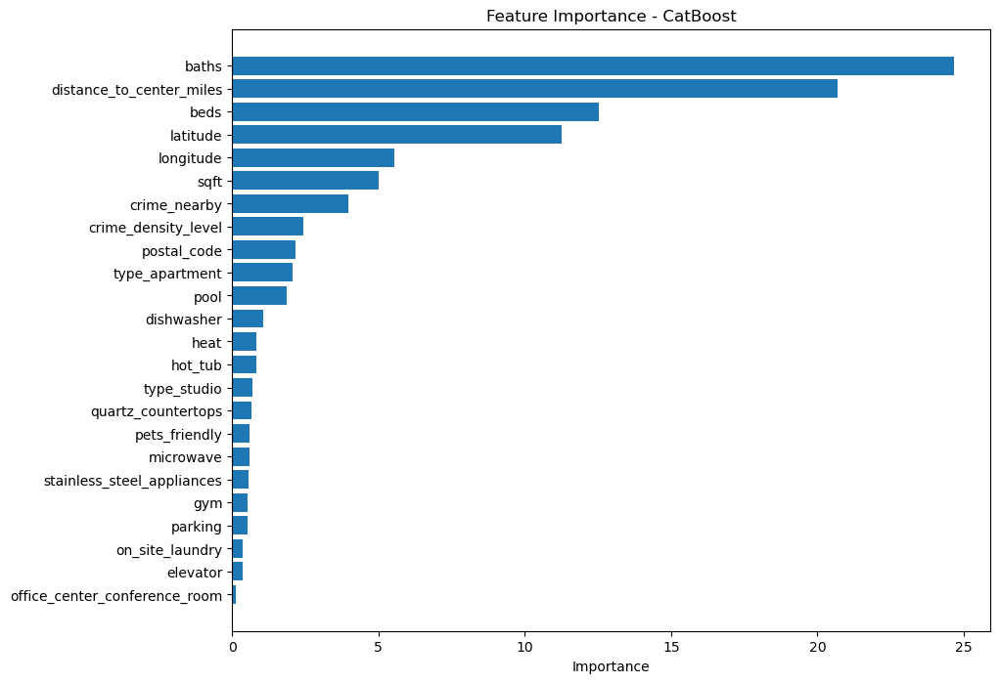

In [112]:
# Лучшая модель CatBoost
best_model = grid_cb.best_estimator_

# Препроцессор и модель отдельно
preprocessor = best_model.named_steps['preprocessor']
model = best_model.named_steps['cb']

# Список признаков после препроцессинга
num_features_transformed = preprocessor.transformers_[0][2]
# Для категориальных через OneHotEncoder создаются новые фичи
cat_features_transformed = preprocessor.transformers_[1][1].named_steps['encoder'].get_feature_names_out(cat_features)

all_features = list(num_features_transformed) + list(cat_features_transformed)

# Feature importance
importances = model.get_feature_importance()
feat_imp_df = pd.DataFrame({
    'Feature': all_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Вывод таблицы
display(feat_imp_df)

# Визуализация
plt.figure(figsize=(10,8))
plt.barh(feat_imp_df['Feature'], feat_imp_df['Importance'])
plt.gca().invert_yaxis()
plt.xlabel('Importance')
plt.title('Feature Importance - CatBoost')
plt.show()

Наибольший вклад в предсказания модели внесли признаки:

- baths
- distance_to_center_miles
- beds
- latitude

Эти признаки напрямую отражают ключевые факторы стоимости жилья: комфортность объекта (baths, beds) и его расположение (distance_to_center_miles, latitude).

Наименьший вклад внесли:

- on_site_laundry	
- elevator	
- office_center_conference_room	

Их влияние на цену минимально, что может объясняться либо низкой вариативностью этих признаков в датасете, либо тем, что они не являются решающими при формировании стоимости аренды.

## Проверка модели на новых данных

In [113]:
# Сохранение модели в формате pickle
with open('best_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)

In [114]:
# Загрузка модели из файла pickle
with open('best_model.pkl', 'rb') as f:
    best_model = pickle.load(f)

In [115]:
# Новые данные
new_data = pd.DataFrame({
    'beds': [1],
    'baths': [1.0],
    'sqft': [452.0],
    'parking': [0],
    'latitude': [41.9214378],
    'longitude': [-87.6513043], 
    'postal_code':[60614],
    'pets_friendly': [1],
    'dishwasher': [1],
    'microwave': [1],
    'stainless_steel_appliances': [0],
    'gym': [0],
    'elevator': [1],
    'office_center_conference_room': [0],
    'on_site_laundry': [1],
    'hot_tub': [0], 
    'pool': [0],
    'heat': [1], 
    'quartz_countertops': [0], 
    'crime_nearby': [3000], 
    'crime_density_level': [1],
    'distance_to_center_miles': [3.5], 
    'type': ['apartment']
})

In [116]:
# Предсказание
predictions = best_model.predict(new_data)

# Вывод результатов
print("Предсказанная цена аренды для указанной квартиры", predictions)

Предсказанная цена аренды для указанной квартиры [2164.43]


## Вывод

Целью проекта было разработать модель, которая предсказывала бы цену аренды квартир в Чикаго. Для этого данные были собраны с помощью веб-скрапинга с сайта по аренде квартир, сохранены в датасет и предобработаны: заполнены или удалены пропуски, преобразованы текстовые и категориальные признаки, исправлены типы данных.

Исследовательский анализ данных показал, что цены варьируются от *\$659* до *\$30000*, площадь — 181–4500 sqft, количество спален — 0–6, ванных — 1–4. Выявлены зависимости цены от площади, количества спален и ванных, а также ряда бинарных признаков (парковка, спортзал, бассейн, джакузи). Проверка мультиколлинеарности и анализ взаимной информации позволили удалить дублирующие и малоинформативные признаки.

Для baseline моделей обучены:
- Linear Regression
- Random Forest
- CatBoost

Linear Regression показала MAE ~421, R² ~0.60, модели на деревьях (Random Forest и CatBoost) почти идеально подгоняли данные на трейне, но имели риск переобучения.

На этапе тюнинга:
- Были добавлены новые признаки: crime_nearby, crime_density_level, distance_to_center_miles (в качестве источника данных использовался открытый датасет Crimes за 2023-2025 гг., предоставляемый порталом City of Chicago)
- Настройка гиперпараметров и cross-validation позволили снизить переобучение и повысить устойчивость моделей.

Результаты после тюнинга: 

- Linear Regression: MAE ~374, RMSE ~603, R² ~0.65; 
- Random Forest: MAE ~355, RMSE ~569, R² ~0.69; 
- CatBoost показала лучший результат
  - на тренировочной выборке MAE ~290, RMSE ~508, R² ~0.75
  - на тестовой выборке MAE ~306, RMSE ~840, R² ~0.67

Наибольший вклад в предсказания модели внесли признаки

- baths
- distance_to_center_miles
- beds
- latitude

Таким образом, ключевыми факторами стоимости аренды оказались комфорт квартиры (baths, beds) и её расположение (distance_to_center_miles, latitude). CatBoost стала оптимальной моделью для предсказания цен: она показала высокую точность, устойчивость к переобучению и адекватно справилась с вариативностью данных. Модель готова к применению на новых данных и для анализа рынка аренды квартир в Чикаго.